In [1]:
import os
import json
import itertools
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import torch
%matplotlib inline

In [2]:
filename="/q3_train.csv"
DATA_DIR = os.path.join(os.path.abspath("../.."),"Data","quartiles")
conditionCols=['finalResult','codeModule','moduleSession']
suffix='Q3-'

In [3]:
DATA_DIR

'/home/slab/Hajra/GANs_2020/Quartile Work/Concat_CGAN_Quarters/Data/quartiles'

In [4]:
df = pd.read_csv(DATA_DIR+filename)
targetColumns=df.columns
columnsToSelect=[suffix+col if col not in conditionCols else col  for col in targetColumns]
df.head()

,finalResult,codeModule,moduleSession,ExternalQuiz,DataPlus,DualPlus,Folder,Forumng,Glossary,HomePage,...,OuElluminate,OuWiki,PageClicks,Questionnaire,Quiz,RepeatActivity,Resource,SharedSubPage,SubPage,Url
0,Pass,1,0,0.0,0,0.0,0.0,6.0,0.0,18.0,...,0.0,0,0.0,0.0,32.0,0,2.0,0.0,10.0,1.0
1,Pass,5,0,15.0,0,0.0,0.0,43.0,0.0,56.0,...,0.0,0,2.0,12.0,444.0,0,8.0,0.0,46.0,16.0
2,Pass,6,1,0.0,0,0.0,0.0,0.0,0.0,6.0,...,0.0,0,0.0,0.0,0.0,0,0.0,0.0,4.0,0.0
3,Fail,1,0,0.0,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
4,Fail,2,0,0.0,0,0.0,0.0,0.0,0.0,49.0,...,0.0,0,0.0,0.0,475.0,0,19.0,0.0,14.0,0.0


In [5]:
columnsToSelect

['finalResult',
 'codeModule',
 'moduleSession',
 'Q3-ExternalQuiz',
 'Q3-DataPlus',
 'Q3-DualPlus',
 'Q3-Folder',
 'Q3-Forumng',
 'Q3-Glossary',
 'Q3-HomePage',
 'Q3-HtmlActivity',
 'Q3-OuCollaborate',
 'Q3-OuContent',
 'Q3-OuElluminate',
 'Q3-OuWiki',
 'Q3-PageClicks',
 'Q3-Questionnaire',
 'Q3-Quiz',
 'Q3-RepeatActivity',
 'Q3-Resource',
 'Q3-SharedSubPage',
 'Q3-SubPage',
 'Q3-Url']

In [6]:
# df=pd.read_csv("/home/slab/Hajra/GANs_2020/Quartile Work/Concat_CGAN_Quarters/Data/quartiles/q2_train.csv")
# targetColumns=df.columns
# columnsToSelect=[suffix+col if col not in conditionCols else col  for col in targetColumns]
# df.head()

###  X=Q3 original 
 ### Y=Synthteic (Q1,Q2)

In [7]:
filenameQ1="../CGAN Q1/Q1_Synthetic.csv" 

q1Synth = pd.read_csv(filenameQ1)

labels,codeValues = pd.factorize(q1Synth['codeModule'])
q1Synth.codeModule=labels
labels,moduleValues = pd.factorize(q1Synth['moduleSession'])
q1Synth.moduleSession=labels

q1Synth.head()

,finalResult,codeModule,moduleSession,ExternalQuiz,DataPlus,DualPlus,Folder,Forumng,Glossary,HomePage,...,OuElluminate,OuWiki,PageClicks,Questionnaire,Quiz,RepeatActivity,Resource,SharedSubPage,SubPage,Url
0,Pass,0,0,4.0,0.0,0.0,4.0,6.0,3.0,3.0,...,2.0,6.0,1.0,4.0,13.0,11.0,16.0,6.0,4.0,17.0
1,Pass,0,0,2.0,4.0,2.0,3.0,4.0,2.0,2.0,...,3.0,5.0,3.0,2.0,0.0,3.0,0.0,2.0,1.0,1.0
2,Pass,0,0,1.0,7.0,2.0,0.0,4.0,4.0,1.0,...,1.0,2.0,8.0,3.0,3.0,0.0,0.0,0.0,4.0,9.0
3,Pass,0,0,7.0,3.0,6.0,0.0,7.0,0.0,3.0,...,2.0,4.0,1.0,0.0,17.0,2.0,14.0,5.0,5.0,0.0
4,Pass,0,0,4.0,2.0,3.0,6.0,4.0,2.0,2.0,...,3.0,3.0,3.0,3.0,0.0,2.0,6.0,1.0,2.0,10.0


In [8]:
filenameQ1="../CGAN Q2/Q2_synthetic_cond_Q1_2kEpochs.csv" 

q2Synth = pd.read_csv(filenameQ1)

labels,codeValues = pd.factorize(q2Synth['codeModule'])
q2Synth.codeModule=labels
labels,moduleValues = pd.factorize(q2Synth['moduleSession'])
q2Synth.moduleSession=labels

q2Synth.head()

,finalResult,codeModule,moduleSession,ExternalQuiz,DataPlus,DualPlus,Folder,Forumng,Glossary,HomePage,...,OuElluminate,OuWiki,PageClicks,Questionnaire,Quiz,RepeatActivity,Resource,SharedSubPage,SubPage,Url
0,Pass,0,0,22.0,123.0,47.0,23.0,59.0,4.0,21.0,...,58.0,45.0,123.0,37.0,72.0,17.0,25.0,26.0,14.0,41.0
1,Pass,0,0,37.0,27.0,20.0,30.0,38.0,26.0,23.0,...,29.0,22.0,0.0,26.0,30.0,39.0,42.0,19.0,28.0,25.0
2,Pass,0,0,47.0,0.0,0.0,80.0,49.0,58.0,40.0,...,44.0,0.0,0.0,16.0,33.0,74.0,53.0,39.0,61.0,25.0
3,Pass,1,1,49.0,0.0,0.0,81.0,45.0,67.0,42.0,...,23.0,0.0,0.0,22.0,6.0,79.0,74.0,46.0,60.0,11.0
4,Pass,0,0,34.0,82.0,40.0,26.0,75.0,14.0,26.0,...,81.0,33.0,68.0,30.0,64.0,22.0,25.0,28.0,39.0,43.0


In [9]:
with open(DATA_DIR+'/meta.pkl', 'rb') as file:  # Overwrites any existing file.
    d=pickle.load(file)
codeModuleMap=d[0]
moduleSessionMap=d[1]

In [25]:
synthData=[q1Synth,q2Synth]

data=pd.DataFrame()
for r in ['Pass','Fail']:
    for c in range(0,len(codeModuleMap)):
        for m in range(0,len(moduleSessionMap)):
            original=df[(df.finalResult==r) &  (df.codeModule==c) & (df.moduleSession==m)].copy().reset_index(drop=True)
            temp=original.iloc[:,0:3]
            originalF=original.iloc[:,3:]
            toSample=originalF.shape[0]
            q=1
            for synth in synthData:
                synthF=synth[(synth.finalResult==r) & (synth.codeModule==c) & (synth.moduleSession==m)].sample(toSample).copy().reset_index(drop=True)
#                 print(r,c,m,toSample,synthF.shape[0])
                synthF=synthF.iloc[:,3:]
                synthF.columns=[ 'Q'+str(q)+'-'+col for col in synthF.columns ]
                q+=1
                temp=pd.concat([temp,synthF],axis=1)
            
            
            originalF.columns=[ 'Q'+str(q)+'-'+col for col in originalF.columns]
            temp=pd.concat([temp,originalF],axis=1)
            data=pd.concat([data,temp],axis=0)
            
print(data.shape)

(17949, 63)


In [27]:
# encode categorical columns for learning
labels,finalResultMap = pd.factorize(data['finalResult'])
data.finalResult=labels
data.head()

,finalResult,codeModule,moduleSession,Q1-ExternalQuiz,Q1-DataPlus,Q1-DualPlus,Q1-Folder,Q1-Forumng,Q1-Glossary,Q1-HomePage,...,Q3-OuElluminate,Q3-OuWiki,Q3-PageClicks,Q3-Questionnaire,Q3-Quiz,Q3-RepeatActivity,Q3-Resource,Q3-SharedSubPage,Q3-SubPage,Q3-Url
0,0,0,0,0.0,5.0,7.0,10.0,1.0,6.0,0.0,...,0.0,0,0.0,0.0,0.0,0,1.0,0.0,10.0,2.0
1,0,0,0,2.0,0.0,4.0,9.0,6.0,2.0,2.0,...,0.0,0,0.0,0.0,0.0,0,1.0,0.0,49.0,29.0
2,0,0,0,2.0,4.0,9.0,12.0,8.0,6.0,3.0,...,0.0,0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0
3,0,0,0,1.0,6.0,0.0,1.0,2.0,7.0,0.0,...,0.0,0,0.0,0.0,0.0,0,0.0,0.0,3.0,1.0
4,0,0,0,4.0,7.0,3.0,0.0,6.0,1.0,0.0,...,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0


In [28]:
finalResultMap

Index(['Pass', 'Fail'], dtype='object')

In [54]:
data.iloc[:2,43:63]

,Q3-ExternalQuiz,Q3-DataPlus,Q3-DualPlus,Q3-Folder,Q3-Forumng,Q3-Glossary,Q3-HomePage,Q3-HtmlActivity,Q3-OuCollaborate,Q3-OuContent,Q3-OuElluminate,Q3-OuWiki,Q3-PageClicks,Q3-Questionnaire,Q3-Quiz,Q3-RepeatActivity,Q3-Resource,Q3-SharedSubPage,Q3-SubPage,Q3-Url
0,7.0,0,0.0,0.0,33.0,0.0,18.0,0.0,0.0,39.0,0.0,0,0.0,0.0,0.0,0,1.0,0.0,10.0,2.0
1,3.0,0,0.0,0.0,252.0,0.0,148.0,0.0,0.0,472.0,0.0,0,0.0,0.0,0.0,0,1.0,0.0,49.0,29.0


In [67]:
classes_count = 51 # 2 results + 7 codes + 2 modules  (contition vector dims)
epochs=3000
input_size = data.shape[1]
input_size

63

# GAN

In [13]:
import torch, time, pickle
import torch.nn as nn
import torch.optim as optim

#### Some helperfunctions:

In [68]:
def loss_plot(hist, path = 'Train_hist.png', model_name = ''):
    x = range(len(hist['D_loss']))

    y1 = hist['D_loss']
    y2 = hist['G_loss']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Iter')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    path = os.path.join(path, model_name + '_loss.png')

    plt.savefig(path)
    plt.show()
    plt.close()
    
def print_network(net):
    num_params = 0
    for param in net.parameters():
        num_params += param.numel()
    print(net)
    print('Total number of parameters: %d' % num_params)

    
def initialize_weights(net):
    for m in net.modules():
        if isinstance(m, nn.Linear):
            # using input feature size to scale random weights (best practice for ReLU AF)
            n = m.in_features
            y = np.sqrt(2.0/n)
            
            m.weight.data.normal_(0, y)
            m.bias.data.zero_()

#### Generator and Discriminator networks

In [39]:
class generator(nn.Module):
    def __init__(self, input_dim, output_dim, input_size, class_num):
        super(generator, self).__init__()
        
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.input_size = input_size
        self.class_num = class_num

        #Has 2 Linear FC layers with 23+500 an 512 neurons each and ReLU AF
        self.fc = nn.Sequential(
            nn.Linear(self.input_dim + self.class_num, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, output_dim),
            nn.BatchNorm1d(output_dim),
            nn.ReLU(),
        )
        initialize_weights(self)

    def forward(self, input, label):
        x = torch.cat([input, label], 1)
        x = self.fc(x)

        return x

class discriminator(nn.Module):
    def __init__(self, input_dim, output_dim, input_size, class_num):
        super(discriminator, self).__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.input_size = input_size
        self.class_num = class_num

        #Has 2 Linear FC layers with 23+500 an 1024 neurons each and ReLU AF
        self.fc = nn.Sequential(
            nn.Linear(input_dim + class_num, 64),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(0.2),
            nn.Linear(64, self.output_dim),
            nn.Sigmoid(), # output is binary
        )
        initialize_weights(self)

    def forward(self, input, label):
        x = torch.cat([input, label], 1)
        x = self.fc(x)

        return x

### CGAN network

In [77]:
class CGAN(object):
    def __init__(self, epoch, batch_size, save_dir, result_dir, log_dir, gpu_mode, input_size, dataloader,z_dim=69,
                model_dir=datetime.now().strftime("%X").replace(':','.') + '_epoch-%d'%epochs,lrG=0.0002, lrD=0.0002,
                beta1=0.5, beta2=0.9999, class_num=classes_count):
        # parameters
        self.save_dir = save_dir
        self.model_dir=model_dir
        self.result_dir = result_dir
        self.log_dir = log_dir
        self.model_name = self.__class__.__name__
        self.gpu_mode = gpu_mode
        self.epoch = epoch
        self.batch_size = batch_size
        self.input_size = input_size
        self.z_dim = z_dim  # noise for generator
        self.class_num = class_num
        self.sample_num = self.class_num ** 2

        # load dataset
        self.data_loader = dataloader # (self.dataset, self.input_size, self.batch_size)
        data = self.data_loader.__iter__().__next__()[0]

        # networks init
        for i in range (1,10):
            self.G = generator(input_dim=self.z_dim, output_dim=data.shape[1], input_size=self.input_size, class_num=self.class_num)
            self.G_optimizer = optim.Adam(self.G.parameters(), lr=lrG, betas=(beta1, beta2))
        
        self.D = discriminator(input_dim=data.shape[1], output_dim=1, input_size=self.input_size, class_num=self.class_num)
        self.D_optimizer = optim.Adam(self.D.parameters(), lr=lrD, betas=(beta1, beta2))
        
        print('---------- Networks architecture -------------')
        print_network(self.G)
        print('-----------------------------------------------')
        print_network(self.D)

        if self.gpu_mode:
            self.G.cuda()
            self.D.cuda()
            self.BCE_loss = nn.BCELoss().cuda()  # binary cross entropy loss
        else:
            self.BCE_loss = nn.BCELoss()

        # fixed noise samples 
        self.sample_z_ = torch.zeros((self.sample_num, self.z_dim))
        for i in range(self.class_num):
            self.sample_z_[i*self.class_num] = torch.rand(1, self.z_dim)
            for j in range(1, self.class_num):
                self.sample_z_[i*self.class_num + j] = self.sample_z_[i*self.class_num]

        # fixed noise conditions sample
        temp = torch.zeros((self.class_num, 1))
        for i in range(self.class_num):
            temp[i, 0] = i

            
        temp_y = torch.zeros((self.sample_num, 1))
        for i in range(self.class_num):
            temp_y[i*self.class_num: (i+1)*self.class_num] = temp

        self.sample_y_ = torch.zeros((self.sample_num, self.class_num)).scatter_(1, temp_y.type(torch.LongTensor), 1)
        if self.gpu_mode:
            self.sample_z_, self.sample_y_ = self.sample_z_.cuda(), self.sample_y_.cuda()

    def train(self):
        self.train_hist = {}
        self.train_hist['D_loss'] = []
        self.train_hist['G_loss'] = []
        self.train_hist['per_epoch_time'] = []
        self.train_hist['total_time'] = []

        self.y_real_, self.y_fake_ = torch.ones(self.batch_size, 1), torch.zeros(self.batch_size, 1)
        if self.gpu_mode:
            self.y_real_, self.y_fake_ = self.y_real_.cuda(), self.y_fake_.cuda()

        self.D.train()
        print('training start!!')
        start_time = time.time()
        for epoch in range(self.epoch):
            self.G.train()
            epoch_start_time = time.time()
            for iter, (x_, y_) in enumerate(self.data_loader):
                if iter == self.data_loader.dataset.__len__() // self.batch_size:
                    break  # epoch complete

                z_ = torch.rand((self.batch_size, self.z_dim))
                
                #places one at specified index location to one-hot encode y
#                 y_vec_ = torch.zeros((self.batch_size, self.class_num)).scatter_(1, .unsqueeze(1), 1)
                y_vec_ = y_.type(torch.FloatTensor)
                
                y_fill_ = y_vec_ 
                if self.gpu_mode:
                    x_, z_, y_vec_, y_fill_ = x_.cuda(), z_.cuda(), y_vec_.cuda(), y_fill_.cuda()

                # update D network
                D_loss=self.updateDiscriminator(z_, x_, y_vec_, y_fill_)

                # update G network
                for i in range(1,10):
                    G_loss=self.updateGenerator(z_, x_, y_vec_, y_fill_)
                    G_loss=self.updateGenerator(z_, x_, y_vec_, y_fill_)
                self.train_hist['G_loss'].append(G_loss.item())
                
                if ((iter + 1) % 30) == 0:
                    print("Epoch: [%2d] [%4d/%4d] D_loss: %.8f, G_loss: %.8f" %
                          ((epoch + 1), (iter + 1), self.data_loader.dataset.__len__() // self.batch_size, D_loss.item(), G_loss.item()))
            
            print("Epoch: [%2d] completed\t D_loss: %.8f, G_loss: %.8f" %(epoch + 1,D_loss.item(), G_loss.item()))
            
            #view data after every 100-epochs and save it as well
            if epoch%100==0 and epoch>0:
                print('Max:\t',np.max(self.generateDataBatch(data).iloc[:,43:].max(axis=0).values))
                self.save(epoch)
                
            self.train_hist['per_epoch_time'].append(time.time() - epoch_start_time)
            
            if epoch%500==0 and epoch>0:
                loss_plot(self.train_hist, os.path.join(self.save_dir, self.model_dir), self.model_name)

        self.train_hist['total_time'].append(time.time() - start_time)
        print("Avg one epoch time: %.2f, total %d epochs time: %.2f" % (np.mean(self.train_hist['per_epoch_time']),
              self.epoch, self.train_hist['total_time'][0]))
        print("Training finish!... save training results")

        self.save(epochs)
        loss_plot(self.train_hist, os.path.join(self.save_dir, self.model_dir), self.model_name)

    def updateDiscriminator(self, z_, x_, y_vec_, y_fill_):
        self.D_optimizer.zero_grad()
        D_real = self.D(x_, y_fill_)
        D_real_loss = self.BCE_loss(D_real, self.y_real_)

        G_ = self.G(z_, y_vec_)
        D_fake = self.D(G_, y_fill_)
        D_fake_loss = self.BCE_loss(D_fake, self.y_fake_)

        D_loss = D_real_loss + D_fake_loss
        self.train_hist['D_loss'].append(D_loss.item())

        D_loss.backward()
        self.D_optimizer.step()
        return D_loss
        
    def updateGenerator(self,z_, x_, y_vec_, y_fill_):
        self.G_optimizer.zero_grad()
        G_ = self.G(z_, y_vec_)
        D_fake = self.D(G_, y_fill_)
        G_loss = self.BCE_loss(D_fake, self.y_real_)
        G_loss.backward()
        self.G_optimizer.step()
        return G_loss
        
    def visualize_results(self, epoch, fix=True):
        self.G.eval()

        if not os.path.exists(self.result_dir + '/' + '/' + self.model_name):
            os.makedirs(self.result_dir + '/' + '/' + self.model_name)

        if fix:
            """ fixed noise """
            samples = self.G(self.sample_z_, self.sample_y_)
        else:
            """ random noise """
            sample_y_ = torch.zeros(self.batch_size, self.class_num).scatter_(1, torch.randint(0, self.class_num - 1, (self.batch_size, 1)).type(torch.LongTensor), 1)
            sample_z_ = torch.rand((self.batch_size, self.z_dim))
            if self.gpu_mode:
                sample_z_, sample_y_ = sample_z_.cuda(), sample_y_.cuda()

            samples = self.G(sample_z_, sample_y_)

        samples = (samples + 1) / 2
        
        if self.gpu_mode:
            samples = samples.cpu().data.numpy()
        else:
            samples = samples.data.numpy()

        np.savetxt(self.result_dir+'/epoch-%d.txt'%epoch, samples, delimiter=',')
        
    def generateDataBatch(self,df,classLabel=None,classCode=None,classModule=None):
        if classLabel is not None:
            randomResults=torch.randint(classLabel,classLabel+1, (self.batch_size, 1))
            print("randomResults  by torch randint in strt-if",randomResults)
        else:
            randomResults=torch.randint(0, 2, (self.batch_size, 1))
            #print("randomResults in strt-else",randomResults)
        
        if classCode is not None:
            randomCodes=torch.randint(classCode, classCode+1, (self.batch_size, 1))
            print("randomCodes in start-if:",randomCodes)
        else:
            randomCodes=torch.randint(0, 7, (self.batch_size, 1))
            #print("randomCodes in start-else:",randomCodes)
            
        if classModule is not None:
            randomModules=torch.randint(classModule, classModule+1, (self.batch_size, 1))
            print("randomModules in start-if:",randomModules)
        else:
            randomModules=torch.randint(0, 2, (self.batch_size, 1))
        
        condition_vecs=torch.cat([ randomResults,randomCodes,randomModules],1)
        print("condition_vecs size",len(condition_vecs),condition_vecs.size()) #512x3
        condition_vecs1=condition_vecs
        print("condition_vecs size1..",len(condition_vecs1),condition_vecs1.size())
        print("values in condition_vec1",condition_vecs1)

        condition_vecs1=pd.DataFrame(condition_vecs1)
        condition_vecs1.columns=['finalResult','codeModule','moduleSession']
#         print("condition_vecs1 columns....", condition_vecs1.head())
        df_new=df.iloc[:,:43]
#         print("columns of the dataframe", df_new.columns)
#         print("D-TYEPSSS and typeeeee of condition vec:",df_new.dtypes,condition_vecs1.dtypes,type(condition_vecs1))
        
        #condition_vecs1['finalResult']=condition_vecs1['finalResult'].astype(int64)
        
        condition_vecs1[['finalResult', 'codeModule','moduleSession']] =  condition_vecs1[['finalResult', 'codeModule','moduleSession']].astype('int64')
        
#         condition_vecs1=condition_vecs1.astype({'finalResult': 'int64'}).dtypes
#         condition_vecs1=condition_vecs1.astype({'codeModule': 'int64'}).dtypes
#         condition_vecs1=condition_vecs1.astype({'moduleSession': 'int64'}).dtypes
#         print("check..!check dtype aaaaagain",condition_vecs1.dtypes)
#         #astype('int64').dtypes
#         print("D-TYEPSSS afterrrrr trying astype ffunction:",condition_vecs1.dtypes, type(condition_vecs1))
        
        print("MERGE STRATS FROM HERE!!!!") 
        #pd.merge(left, right, on=['key1', 'key2'])df_new
        merge=pd.merge(left=condition_vecs1, right=df_new, on=['finalResult','codeModule','moduleSession'],how='outer')
#         print("merge.columnss",merge.shape, merge.columns)
        merge=merge.sample(frac=1).reset_index(drop=True)
        print("shape oof merge",merge.shape)
        merge_new=merge.iloc[:self.batch_size,:]
        print("shape of batch from 8870 rows and type pof merge",merge_new.shape, type(merge_new))
#         print("merge_new columns...",merge_new.columns)
#         X_input=merge_new.iloc[:,:]
        oneHot=merge_new.iloc[:,:3]
        oneHot = torch.tensor(oneHot.values)
        print("oneHot type to tensor",type(oneHot))
        
        #oneHot=torch.cat([ randomResults,randomCodes,randomModules],1)
        
        t_vecs=[_torch_one_hot(t_c).unsqueeze(0) for t_c in oneHot]#one hot
#         print("t_vecs coln tyype",len(t_vecs[0]),type(t_vecs)) #512x1
#         print("t_vecs length rows",len(t_vecs),type(t_vecs))
        
        #sample_y_ = torch.cat(t_vecs,0).type(torch.FloatTensor) #512X11  
        
        cat = nn.quantized.FloatFunctional()
        sample_y_=cat.cat(t_vecs,0).type(torch.FloatTensor)
#         print("GATE5 check values for one hot in sampppple_y_: ",type(sample_y_),sample_y_)
#         print("sample_y_ type after concat: torch.cat(t_vecs,0)",type(sample_y_),len(sample_y_[0]),len(sample_y_))
#         print("t_vec:DTYYYYYPE>>>",t_vecs.dtype)
#         print("LETS CHECK IF WE REACH HERE..")
        
        sample_y_ = pd.DataFrame(sample_y_)
#         print("COLUMNS OF SMAPLE_Y_:",sample_y_.columns,sample_y_.shape)
        sample_y_.columns = ['1','2','3','4','5','6','7','8','9','10','11']
        print("COLUMNS OF SMAPLE_Y_:",sample_y_.shape)
        print("columns of merge_new..PLZ CHECK", merge_new.shape)
        sample_y_[['Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire','Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage','Q1-Url','Q2-ExternalQuiz','Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary',
       'Q2-HomePage', 'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',  'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage','Q2-Url'
                  ]]=merge_new[['Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire','Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage','Q1-Url','Q2-ExternalQuiz','Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary',
       'Q2-HomePage', 'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',  'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage','Q2-Url']]
        print("COLUMNS OF SMAPLE_Y_after adding new:",sample_y_.columns,sample_y_.shape)
#         print("COLUMNS OF DF::",df.columns)
#         print("sample_y_ shape after conversion to dataframe:", sample_y_.shape)
#         sample_y_=torch.cat(sample_y_,df.iloc[:,3:23])#should this be added to make sample_y of 23 cols
        
#         tensor_data=merge_new.iloc[:,3:]
#         tensor_data = tensor_data.numpy()
#         tensor_data=torch.tensor(tensor_data.values)#conversion of DF to tensore
#         print("tensore_data type",type(tensor_data))
#         final_df=torch.cat((sample_y_, tensor_data), 0)
#         sample_y_=torch.cat((tensor_data),0) not working
#         sample_y_=sample_y_.numpy()
#         print("sample_y_ type after conversion of tensor to numpy", type(sample_y_),sample_y_.shape)
#         tensor_data=tensor_data.to_numpy()
#         print("tensor data type after conversion to numpy..",type(tensor_data),tensor_data.shape)
#         sample_y_=np.append(sample_y_,tensor_data)
     
#         print("sample_y_ size and type adn length",sample_y_,sample_y_.shape)
    
        print("GATE 3")

#         sample_y_=sample_y_.append(merge_new)
#         #sample_y_=sample_y_.append(df.iloc[:self.batch_size,3:23]) #df.iloc[:self.batch_size,3:23]
#         print("sample Y SHAPE AFTER APPEND...",sample_y_.shape)
#         print("sample_y_ head",sample_y_.head())
#         print("CHECK TILLL HEREEE")
        
        #sampleTry = pd.merge(left=df, right=sample_y_, left_on='species_id', right_on='species_id')
        
        sample_y_=sample_y_.fillna(0)
#         print("sample_y_ types after append",type(sample_y_), sample_y_.shape,sample_y_)
        sample_y_=sample_y_.to_numpy()
#         print("sample_y_ numpy  conversion:",type(sample_y_))
#         print("sampley dtupe...",sample_y_.dtype)
        sample_y_=sample_y_.astype(np.float64)
#         print("sampley dtype. after astype..",sample_y_.dtype)
        
#         temp = []
#         for i in sample_y_:
#             temp.append(i)
        
#         sample_y_=torch.from_numpy(sample_y_)
#         print("torch.from numpy@@@...sample_y_",type(sample_y_))
        print("working her!")
#         sample_y_=sample_y_.type(torch.FloatTensor)
        sample_y_=(torch.Tensor(np.array(sample_y_)))
        print("sample_y_4445566",type(sample_y_))
        #sample_y_ = sample_y_.numpy()
        #sample_y_=torch.tensor(sample_y_)
#         print("samples_y_ type and size:GATE 4",type(sample_y_), sample_y_.size()) #512x11 
#         print("sample_y_.......",sample_y_)
        print("getting inside sample z:...")
        sample_z_ = torch.rand((self.batch_size, self.z_dim))
        
        if self.gpu_mode:
            sample_z_, sample_y_ = sample_z_.cuda(), sample_y_.cuda()
            samples = self.G(sample_z_, sample_y_) # THE ERRORRR CCCCCOMES HEREEE.........
            print("do we get in this loop!. self.gpuMode",samples.size())
        print("does it execute here.....")#DOESNT REACH HERE

        samples = (samples + 1) / 2
        print("(samples + 1) / 2",(samples + 1) / 2)
        print("does it reach here2222........")


        if self.gpu_mode:
            samples = samples.cpu().data.numpy()
            sample_y_= sample_y_.cpu().data.numpy()
        else:
            samples = samples.data.numpy()
            sample_y_= sample_y_.data.numpy()

        samples=samples.round()
        print("type of samples and shape: ",type(samples),samples.shape)
        print("samples=samples.round()",samples)
        
#         sample_y_ = sample_y_.numpy()
#         print("TYPE OF SAMPLE_Y_......:",type(sample_y_),sample_y_,sample_y_.shape)
#         sample_y_=np.concatenate((sample_y_,samples[:,:20]))
#         print("SAMPLE_Y_ after concat with samples columnss: ",type(sample_y_),sample_y_)
        #np.concatenate((synthDataDf,df.iloc[:,3:23]))

        finalResult=np.argmax(sample_y_[:,:2],1)
        print("finalResult",finalResult)
        
        codeModule=np.argmax(sample_y_[:,2:9],1)
        print("codeModule",codeModule)
        
        moduleSession=np.argmax(sample_y_[:,9:11],1)
        print("moduleSession",moduleSession)
        
        cond_col=sample_y_[:, 11:]
        #print("condition columns...",cond_col.shape,type(cond_col))
        
        synthData=np.c_[finalResult,codeModule,moduleSession,cond_col,samples]
#         print("synthData after concat np-c_:",synthData, type(synthData),synthData.shape)

        synthDataDf=pd.DataFrame(synthData,columns=data.columns)
#         print("synthData after conversion to df:",type(synthData),synthData.shape)
        #print("synthDataDf.columnsss",synthDataDf.columns)
#         print("SAMPLE_Y_ NOW...!",sample_y_)
#         print("type of sample_y_and shape",type(sample_y_),sample_y_.shape)
        g=np.argmax(sample_y_[:,:2],axis=1)
#         print("np.argmax(sample_y_,axis=1",g,type(g))
#         print("finalResultMap",finalResultMap)
        

        synthDataDf.finalResult = list(finalResultMap[i] for i in np.argmax(sample_y_[:,:2],axis=1))
#         print("synthDataDf.finalResult", synthDataDf.finalResult)
            
        synthDataDf.moduleSession = synthDataDf.apply(
            lambda x:'%s' % moduleSessionMap[x['moduleSession'] 
                                             if x['moduleSession']>=0 and x['moduleSession']<len(moduleSessionMap) 
                                             else (
                                                 0 if x['moduleSession']>0 else len(moduleSessionMap)-1
                                             ) ],
            axis=1
        )
        synthDataDf.codeModule = synthDataDf.apply(
            lambda x:'%s' % codeModuleMap[x['codeModule'] 
                                             if x['codeModule']>=0 and x['codeModule']<len(codeModuleMap) 
                                             else (
                                                 0 if x['codeModule']>0 else len(codeModuleMap)-1
                                             ) ],
            axis=1
        )

        
        
        #synthDataDf=np.concatenate((synthDataDf,df.iloc[:,3:23]))
        #return synthDataDf,type(synthDataDf)
        
        return synthDataDf
    
    def generateData(self,batches=1,classLabel=None,code=None,module=None):
        usePassed=False
        print("usePassed=False..")
        if classLabel is not None:
            print("here in usePassed=True")
            usePassed=True
            try:
                if type(classLabel)== str:
                    print('string')
                    classLabel=list(finalResultMap).index(classLabel)
                elif classLabel<0 or classLabel>len(finalResultMap)-1:
                    classLabel=1  #default generate for Fail class
            except:
                classLabel=1  #default generate for Fail class
        
        df=pd.DataFrame(columns=data.columns)
        print("in dataframe...",df.columns)
        
        conditions=[]
        for r in range(0,2):
            for c in range(0,len(codeModuleMap)):
                for m in range(0,len(moduleSessionMap)):
                    conditions.append((r,c,m))
                    print("appending conditions..")
        
        for b in range(batches):
            print("in batches..",batches)
            if usePassed:
                print("do we reach here in batches-if!...")
                r=classLabel
            else:
                r=conditions[b%28][0] #2*7*2=28
                print("or in else of batches..?")
            
            c= code if code else conditions[b%28][1]
            m= module if module else conditions[b%28][2]
            print("making df to concat with generateDaaaaataBatch..")
            
            df=pd.concat([df,self.generateDataBatch(data,classLabel= r,classCode=c,classModule=m)])
        return df
        
    def save(self,e):
        save_dir = os.path.join(self.save_dir, self.model_dir)

        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

        torch.save(self.G.state_dict(), os.path.join(save_dir, self.model_name + '_G_epoch-%d.pkl'%e))
        torch.save(self.D.state_dict(), os.path.join(save_dir, self.model_name + '_D_epoch-%d.pkl'%e))

        with open(os.path.join(save_dir, self.model_name + '_history_epoch-%d.pkl'%e), 'wb') as f:
            pickle.dump(self.train_hist, f)

    def load(self,e):
        save_dir = os.path.join(self.save_dir, self.model_dir)

        self.G.load_state_dict(torch.load(os.path.join(save_dir, self.model_name + '_G_epoch-%d.pkl'%e)))
        self.D.load_state_dict(torch.load(os.path.join(save_dir, self.model_name + '_D_epoch-%d.pkl'%e)))
        print(os.path.join(save_dir, self.model_name + '_history_epoch-%d.pkl'%e))
        with open(os.path.join(save_dir, self.model_name + '_history_epoch-%d.pkl'%e),'rb') as input_file:
            self.train_hist=pickle.load(input_file)

### Write PyTorch custom DataLoader
I am using Bin number as condition for CGAN and other features as input.

In theory, it will now learn distribution of students belonging to each bin and as student in each bin has same theoratical behavior so we can generate data for those students

In [41]:
def _torch_one_hot(y, n_dims=[2,7,2], dtype=torch.LongTensor):
    scatter_dim = len(y.size())
    y_tensor = y.type(torch.LongTensor).view(*y.size(), -1)
    zeros = torch.zeros(*y.size(), sum(n_dims)).type(dtype)
    
    full_one_hot=zeros.scatter(scatter_dim, y_tensor, 1)
    
    vectors=[]
    for (n,d) in enumerate(n_dims):
        vectors.append(full_one_hot[n,:d])
    
    # to combine into batch
    # v1=_to_one_hot(yS[0])
    # v2=_to_one_hot(yS[1])
    # torch.cat((v1.unsqueeze(0),v2.unsqueeze(0)),0)
    return torch.cat(vectors,-1)

def np_one_hot(y, n_dims=[2,7,2]):
    b = np.zeros((y.size, sum(n_dims)),dtype=int)
    b[np.arange(y.size),y] = 1
    
    vectors=[]
    for (n,d) in enumerate(n_dims):
        vectors.append(b[n,:d])
    
    return np.concatenate(vectors,-1)

In [78]:
from torch.utils.data import Dataset, DataLoader

class CustomDataset(Dataset):
    def __init__(self, df, transform=None, target_transform=None):
        self.transform = transform
        self.target_transform = target_transform

        y_columns = ['finalResult','codeModule','moduleSession']
        x_columns = list(set(df.columns) - set(y_columns))
        
        self.x = df[x_columns]
        self.y = df[y_columns]

    def __len__(self):
        return self.x.shape[0]

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()[0]
    
        x = self.x.iloc[idx].values
        y = self.y.iloc[idx].values
        
        x = torch.from_numpy(x).type(torch.FloatTensor)
        
        if self.transform:
            x = self.transform(x)
            
        if self.target_transform:
            y = self.target_transform(y)
        
        return x[40:], np.concatenate((x[:40],np_one_hot(y)))

In [79]:
batch_size = 512

d = CustomDataset(data)
data_loader = DataLoader(d, batch_size=batch_size, shuffle=True)

In [80]:
for (id,(_x,_y)) in enumerate(data_loader):
    print(_x,_x.shape)
    print(_y,_y.shape)
    break

tensor([[ 3.,  0., 77.,  ..., 23.,  0.,  7.],
        [ 2., 10., 43.,  ..., 29.,  1.,  3.],
        [ 3.,  9., 37.,  ..., 17.,  5.,  7.],
        ...,
        [ 3., 11., 16.,  ..., 39.,  4.,  4.],
        [ 1., 23., 35.,  ..., 19.,  7.,  0.],
        [ 0., 23., 39.,  ...,  6.,  2.,  0.]]) torch.Size([512, 20])
tensor([[ 29.,  61.,   0.,  ...,   0.,   1.,   0.],
        [ 37.,  52.,   0.,  ...,   0.,   0.,   1.],
        [ 47.,  42.,  58.,  ...,   0.,   1.,   0.],
        ...,
        [ 24.,  39., 142.,  ...,   0.,   1.,   0.],
        [ 22.,  41.,   0.,  ...,   0.,   1.,   0.],
        [ 21.,  33.,   0.,  ...,   0.,   0.,   1.]], dtype=torch.float64) torch.Size([512, 51])


In [22]:
def loadAndPlotModel(e,m_dir='02.54.07_epoch-2000'):
    model = CGAN(
        epoch=e,
        batch_size=batch_size,
        save_dir='models',
        result_dir='results',
        log_dir='logs',
        gpu_mode=True,
        input_size=input_size,
        dataloader=data_loader,
        z_dim=z_dim,
        lrG=lrG,
        model_dir=m_dir,
        lrD=lrD,
        beta1=beta1,
        beta2=beta2
    )
    model.load(e)
    loss_plot(model.train_hist, os.path.join(model.save_dir, model.model_dir), model.model_name)
    
    return model

In [81]:
epoch = epochs
z_dim = 51
beta1 = 0.5
beta2 = 0.9
lrG = 0.00018
lrD = 0.00004

cgan = CGAN(
    epoch=epoch,
    batch_size=batch_size,
    save_dir='models',
    result_dir='results',
    log_dir='logs',
    gpu_mode=True,
    input_size=input_size,
    dataloader=data_loader,
    z_dim=z_dim,
    lrG=lrG,
    lrD=lrD,
    beta1=beta1,
    beta2=beta2
)

---------- Networks architecture -------------
generator(
  (fc): Sequential(
    (0): Linear(in_features=102, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=256, out_features=20, bias=True)
    (4): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
)
Total number of parameters: 32060
-----------------------------------------------
discriminator(
  (fc): Sequential(
    (0): Linear(in_features=71, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=64, out_features=1, bias=True)
    (4): Sigmoid()
  )
)
Total number of parameters: 4801


training start!!
Epoch: [ 1] [  30/  35] D_loss: 1.52418768, G_loss: 0.67328936
Epoch: [ 1] completed	 D_loss: 1.51867771, G_loss: 0.67738104
Epoch: [ 2] [  30/  35] D_loss: 1.50159669, G_loss: 0.67101705
Epoch: [ 2] completed	 D_loss: 1.51585531, G_loss: 0.68125308
Epoch: [ 3] [  30/  35] D_loss: 1.49177957, G_loss: 0.67840111
Epoch: [ 3] completed	 D_loss: 1.48708844, G_loss: 0.66559601
Epoch: [ 4] [  30/  35] D_loss: 1.48048997, G_loss: 0.68016446
Epoch: [ 4] completed	 D_loss: 1.47030640, G_loss: 0.67119610
Epoch: [ 5] [  30/  35] D_loss: 1.45860434, G_loss: 0.67550325
Epoch: [ 5] completed	 D_loss: 1.46748304, G_loss: 0.68313384
Epoch: [ 6] [  30/  35] D_loss: 1.44611669, G_loss: 0.69187719
Epoch: [ 6] completed	 D_loss: 1.44250607, G_loss: 0.67507613
Epoch: [ 7] [  30/  35] D_loss: 1.44319320, G_loss: 0.66768336
Epoch: [ 7] completed	 D_loss: 1.44270134, G_loss: 0.67980599
Epoch: [ 8] [  30/  35] D_loss: 1.42865157, G_loss: 0.67875493
Epoch: [ 8] completed	 D_loss: 1.42999578, G_

Epoch: [66] completed	 D_loss: 1.15296364, G_loss: 0.92391253
Epoch: [67] [  30/  35] D_loss: 1.22436762, G_loss: 0.78036982
Epoch: [67] completed	 D_loss: 1.21321297, G_loss: 0.83386075
Epoch: [68] [  30/  35] D_loss: 1.20107818, G_loss: 0.80969828
Epoch: [68] completed	 D_loss: 1.25828218, G_loss: 0.74747843
Epoch: [69] [  30/  35] D_loss: 1.22443676, G_loss: 0.77800095
Epoch: [69] completed	 D_loss: 1.20433760, G_loss: 0.80604547
Epoch: [70] [  30/  35] D_loss: 1.18521214, G_loss: 0.87974602
Epoch: [70] completed	 D_loss: 1.16258049, G_loss: 0.89024836
Epoch: [71] [  30/  35] D_loss: 1.21697927, G_loss: 0.80284953
Epoch: [71] completed	 D_loss: 1.18508267, G_loss: 0.83385277
Epoch: [72] [  30/  35] D_loss: 1.15396130, G_loss: 0.85687381
Epoch: [72] completed	 D_loss: 1.20301914, G_loss: 0.81700301
Epoch: [73] [  30/  35] D_loss: 1.26381040, G_loss: 0.73017883
Epoch: [73] completed	 D_loss: 1.17912340, G_loss: 0.84438837
Epoch: [74] [  30/  35] D_loss: 1.21818459, G_loss: 0.78460979


Epoch: [102] [  30/  35] D_loss: 1.01371646, G_loss: 1.00738692
Epoch: [102] completed	 D_loss: 1.07267630, G_loss: 0.96122605
Epoch: [103] [  30/  35] D_loss: 1.10954630, G_loss: 0.86368918
Epoch: [103] completed	 D_loss: 1.12215710, G_loss: 0.84925020
Epoch: [104] [  30/  35] D_loss: 1.00537682, G_loss: 0.95223939
Epoch: [104] completed	 D_loss: 1.01976252, G_loss: 1.04262614
Epoch: [105] [  30/  35] D_loss: 1.07348239, G_loss: 0.89981657
Epoch: [105] completed	 D_loss: 1.02767110, G_loss: 1.02973711
Epoch: [106] [  30/  35] D_loss: 1.17147279, G_loss: 0.78695750
Epoch: [106] completed	 D_loss: 1.13988650, G_loss: 0.82414740
Epoch: [107] [  30/  35] D_loss: 1.12100697, G_loss: 0.87196869
Epoch: [107] completed	 D_loss: 1.04448020, G_loss: 0.91067988
Epoch: [108] [  30/  35] D_loss: 1.05689073, G_loss: 0.96531522
Epoch: [108] completed	 D_loss: 1.07056975, G_loss: 0.89089704
Epoch: [109] [  30/  35] D_loss: 1.14438105, G_loss: 0.82860982
Epoch: [109] completed	 D_loss: 1.11804008, G_l

Epoch: [167] [  30/  35] D_loss: 0.89393568, G_loss: 1.01070428
Epoch: [167] completed	 D_loss: 1.00517273, G_loss: 0.88295126
Epoch: [168] [  30/  35] D_loss: 1.00538874, G_loss: 0.87377656
Epoch: [168] completed	 D_loss: 0.88120645, G_loss: 1.11589003
Epoch: [169] [  30/  35] D_loss: 0.97077650, G_loss: 0.88798034
Epoch: [169] completed	 D_loss: 0.88870192, G_loss: 0.98048842
Epoch: [170] [  30/  35] D_loss: 0.97690725, G_loss: 0.94989938
Epoch: [170] completed	 D_loss: 0.95177811, G_loss: 0.99327660
Epoch: [171] [  30/  35] D_loss: 1.00617790, G_loss: 0.90162033
Epoch: [171] completed	 D_loss: 0.93170047, G_loss: 1.04886770
Epoch: [172] [  30/  35] D_loss: 0.96810412, G_loss: 0.95804447
Epoch: [172] completed	 D_loss: 0.96463108, G_loss: 0.96194422
Epoch: [173] [  30/  35] D_loss: 0.95468938, G_loss: 1.03445852
Epoch: [173] completed	 D_loss: 0.92238230, G_loss: 1.04417586
Epoch: [174] [  30/  35] D_loss: 0.90292871, G_loss: 1.08517218
Epoch: [174] completed	 D_loss: 0.88134986, G_l

Epoch: [202] [  30/  35] D_loss: 0.82694495, G_loss: 1.19546604
Epoch: [202] completed	 D_loss: 0.80990291, G_loss: 1.12643266
Epoch: [203] [  30/  35] D_loss: 0.81940132, G_loss: 1.39622736
Epoch: [203] completed	 D_loss: 0.89632034, G_loss: 0.99904698
Epoch: [204] [  30/  35] D_loss: 0.92542017, G_loss: 0.97395450
Epoch: [204] completed	 D_loss: 0.87212276, G_loss: 1.10256827
Epoch: [205] [  30/  35] D_loss: 0.90348208, G_loss: 1.08493161
Epoch: [205] completed	 D_loss: 0.85661972, G_loss: 1.13724339
Epoch: [206] [  30/  35] D_loss: 0.88593054, G_loss: 1.19283748
Epoch: [206] completed	 D_loss: 0.90285444, G_loss: 1.06372380
Epoch: [207] [  30/  35] D_loss: 0.90127265, G_loss: 1.09248781
Epoch: [207] completed	 D_loss: 0.89495933, G_loss: 1.10052454
Epoch: [208] [  30/  35] D_loss: 0.83976561, G_loss: 1.15764952
Epoch: [208] completed	 D_loss: 0.88262367, G_loss: 1.06458843
Epoch: [209] [  30/  35] D_loss: 0.89050186, G_loss: 1.09503210
Epoch: [209] completed	 D_loss: 0.85457587, G_l

Epoch: [267] [  30/  35] D_loss: 0.81642342, G_loss: 1.19711888
Epoch: [267] completed	 D_loss: 0.84578669, G_loss: 1.04548573
Epoch: [268] [  30/  35] D_loss: 0.85629022, G_loss: 1.15086389
Epoch: [268] completed	 D_loss: 0.79573369, G_loss: 1.10699511
Epoch: [269] [  30/  35] D_loss: 0.66964567, G_loss: 1.49756980
Epoch: [269] completed	 D_loss: 0.78938764, G_loss: 1.09843540
Epoch: [270] [  30/  35] D_loss: 0.73110968, G_loss: 1.10878634
Epoch: [270] completed	 D_loss: 0.81801271, G_loss: 1.05351543
Epoch: [271] [  30/  35] D_loss: 0.84655631, G_loss: 1.04557347
Epoch: [271] completed	 D_loss: 0.81670856, G_loss: 1.06843781
Epoch: [272] [  30/  35] D_loss: 0.74723601, G_loss: 1.18579674
Epoch: [272] completed	 D_loss: 0.83036292, G_loss: 1.15588200
Epoch: [273] [  30/  35] D_loss: 0.79368275, G_loss: 1.15269518
Epoch: [273] completed	 D_loss: 0.78007650, G_loss: 1.21413136
Epoch: [274] [  30/  35] D_loss: 0.72304279, G_loss: 1.33243608
Epoch: [274] completed	 D_loss: 0.86035496, G_l

Epoch: [302] [  30/  35] D_loss: 0.81255788, G_loss: 1.32477927
Epoch: [302] completed	 D_loss: 0.64954698, G_loss: 1.17480361
Epoch: [303] [  30/  35] D_loss: 0.67282158, G_loss: 1.36271977
Epoch: [303] completed	 D_loss: 0.72738469, G_loss: 1.37257481
Epoch: [304] [  30/  35] D_loss: 0.80677152, G_loss: 1.30550694
Epoch: [304] completed	 D_loss: 0.74501896, G_loss: 1.15049362
Epoch: [305] [  30/  35] D_loss: 0.73809338, G_loss: 1.30521250
Epoch: [305] completed	 D_loss: 0.74975222, G_loss: 1.16629255
Epoch: [306] [  30/  35] D_loss: 0.85280961, G_loss: 0.98489863
Epoch: [306] completed	 D_loss: 0.78906268, G_loss: 1.04768991
Epoch: [307] [  30/  35] D_loss: 0.82466298, G_loss: 1.05591702
Epoch: [307] completed	 D_loss: 0.80913687, G_loss: 1.06867039
Epoch: [308] [  30/  35] D_loss: 0.75566703, G_loss: 1.22354424
Epoch: [308] completed	 D_loss: 0.71157610, G_loss: 1.40494168
Epoch: [309] [  30/  35] D_loss: 0.87839293, G_loss: 0.95377195
Epoch: [309] completed	 D_loss: 0.69554001, G_l

Epoch: [367] [  30/  35] D_loss: 0.70671868, G_loss: 1.05995405
Epoch: [367] completed	 D_loss: 0.77311718, G_loss: 1.42559910
Epoch: [368] [  30/  35] D_loss: 0.68255979, G_loss: 1.25996351
Epoch: [368] completed	 D_loss: 0.67265522, G_loss: 1.26998866
Epoch: [369] [  30/  35] D_loss: 0.75788987, G_loss: 1.33605886
Epoch: [369] completed	 D_loss: 0.82267624, G_loss: 1.20337033
Epoch: [370] [  30/  35] D_loss: 0.75846159, G_loss: 1.39535713
Epoch: [370] completed	 D_loss: 0.75156641, G_loss: 1.19338536
Epoch: [371] [  30/  35] D_loss: 0.72947925, G_loss: 1.22649872
Epoch: [371] completed	 D_loss: 0.80187732, G_loss: 1.19699812
Epoch: [372] [  30/  35] D_loss: 0.69009495, G_loss: 1.24597359
Epoch: [372] completed	 D_loss: 0.63746822, G_loss: 1.21490288
Epoch: [373] [  30/  35] D_loss: 0.69100475, G_loss: 1.42691898
Epoch: [373] completed	 D_loss: 0.75919545, G_loss: 1.30531859
Epoch: [374] [  30/  35] D_loss: 0.78429890, G_loss: 1.23350668
Epoch: [374] completed	 D_loss: 0.82607388, G_l

Epoch: [402] [  30/  35] D_loss: 0.71550620, G_loss: 1.32550752
Epoch: [402] completed	 D_loss: 0.74215126, G_loss: 1.27162051
Epoch: [403] [  30/  35] D_loss: 0.70932913, G_loss: 1.19286931
Epoch: [403] completed	 D_loss: 0.67036480, G_loss: 1.36510944
Epoch: [404] [  30/  35] D_loss: 0.70786297, G_loss: 1.36785817
Epoch: [404] completed	 D_loss: 0.74918211, G_loss: 1.21413708
Epoch: [405] [  30/  35] D_loss: 0.78065860, G_loss: 1.35079610
Epoch: [405] completed	 D_loss: 0.65500659, G_loss: 1.10511851
Epoch: [406] [  30/  35] D_loss: 0.69720232, G_loss: 1.39777565
Epoch: [406] completed	 D_loss: 0.75590634, G_loss: 1.14907086
Epoch: [407] [  30/  35] D_loss: 0.84995699, G_loss: 1.27762067
Epoch: [407] completed	 D_loss: 0.73508972, G_loss: 1.09125364
Epoch: [408] [  30/  35] D_loss: 0.62191486, G_loss: 1.40366745
Epoch: [408] completed	 D_loss: 0.71359944, G_loss: 1.36026037
Epoch: [409] [  30/  35] D_loss: 0.85772210, G_loss: 1.08495367
Epoch: [409] completed	 D_loss: 0.65653557, G_l

Epoch: [467] [  30/  35] D_loss: 0.69409013, G_loss: 1.40137768
Epoch: [467] completed	 D_loss: 0.68055201, G_loss: 1.12152088
Epoch: [468] [  30/  35] D_loss: 0.74132246, G_loss: 1.03977942
Epoch: [468] completed	 D_loss: 0.67930305, G_loss: 1.42365217
Epoch: [469] [  30/  35] D_loss: 0.69793200, G_loss: 1.17400932
Epoch: [469] completed	 D_loss: 0.77168858, G_loss: 0.97594190
Epoch: [470] [  30/  35] D_loss: 0.70727104, G_loss: 1.36490321
Epoch: [470] completed	 D_loss: 0.76896024, G_loss: 1.16976619
Epoch: [471] [  30/  35] D_loss: 0.67109418, G_loss: 1.20523512
Epoch: [471] completed	 D_loss: 0.69120073, G_loss: 1.39138079
Epoch: [472] [  30/  35] D_loss: 0.74277723, G_loss: 1.62241197
Epoch: [472] completed	 D_loss: 0.75038946, G_loss: 1.29668140
Epoch: [473] [  30/  35] D_loss: 0.68522906, G_loss: 1.04788792
Epoch: [473] completed	 D_loss: 0.74713516, G_loss: 1.50383711
Epoch: [474] [  30/  35] D_loss: 0.68976486, G_loss: 1.18300235
Epoch: [474] completed	 D_loss: 0.73900908, G_l

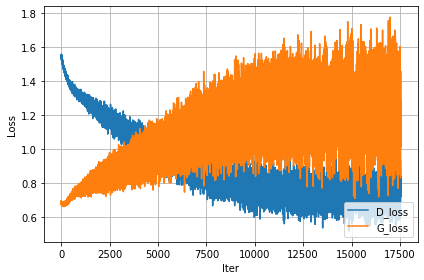

Epoch: [502] [  30/  35] D_loss: 0.81677735, G_loss: 1.10196018
Epoch: [502] completed	 D_loss: 0.85198212, G_loss: 1.17844141
Epoch: [503] [  30/  35] D_loss: 0.72170639, G_loss: 1.05043995
Epoch: [503] completed	 D_loss: 0.74678886, G_loss: 1.15521765
Epoch: [504] [  30/  35] D_loss: 0.72618818, G_loss: 1.12630630
Epoch: [504] completed	 D_loss: 0.80399930, G_loss: 0.91696304
Epoch: [505] [  30/  35] D_loss: 0.81231153, G_loss: 1.20724344
Epoch: [505] completed	 D_loss: 0.80451894, G_loss: 0.98725891
Epoch: [506] [  30/  35] D_loss: 0.63898891, G_loss: 1.55384970
Epoch: [506] completed	 D_loss: 0.71116817, G_loss: 1.15918231
Epoch: [507] [  30/  35] D_loss: 0.64292413, G_loss: 1.55309474
Epoch: [507] completed	 D_loss: 0.67702556, G_loss: 1.13987422
Epoch: [508] [  30/  35] D_loss: 0.69586849, G_loss: 1.17246962
Epoch: [508] completed	 D_loss: 0.84398222, G_loss: 1.41156197
Epoch: [509] [  30/  35] D_loss: 0.85929376, G_loss: 1.17984033
Epoch: [509] completed	 D_loss: 0.80728990, G_l

Epoch: [567] [  30/  35] D_loss: 0.66069138, G_loss: 1.34732723
Epoch: [567] completed	 D_loss: 0.79759502, G_loss: 1.06693947
Epoch: [568] [  30/  35] D_loss: 0.61858535, G_loss: 1.35926390
Epoch: [568] completed	 D_loss: 0.72281361, G_loss: 1.23918366
Epoch: [569] [  30/  35] D_loss: 0.79058057, G_loss: 1.09200251
Epoch: [569] completed	 D_loss: 0.80137908, G_loss: 1.54996896
Epoch: [570] [  30/  35] D_loss: 0.66638947, G_loss: 1.31481588
Epoch: [570] completed	 D_loss: 0.68361080, G_loss: 1.09165561
Epoch: [571] [  30/  35] D_loss: 0.64535868, G_loss: 1.27232468
Epoch: [571] completed	 D_loss: 0.88758421, G_loss: 0.87753314
Epoch: [572] [  30/  35] D_loss: 0.83693641, G_loss: 1.06173754
Epoch: [572] completed	 D_loss: 0.96268678, G_loss: 0.85220253
Epoch: [573] [  30/  35] D_loss: 0.80675375, G_loss: 1.06322551
Epoch: [573] completed	 D_loss: 0.81879592, G_loss: 1.12642848
Epoch: [574] [  30/  35] D_loss: 0.93177187, G_loss: 1.07203591
Epoch: [574] completed	 D_loss: 0.85126549, G_l

Epoch: [602] [  30/  35] D_loss: 0.83900964, G_loss: 1.08186626
Epoch: [602] completed	 D_loss: 0.67473018, G_loss: 1.19606686
Epoch: [603] [  30/  35] D_loss: 0.65408880, G_loss: 1.33349776
Epoch: [603] completed	 D_loss: 0.60518909, G_loss: 1.52254522
Epoch: [604] [  30/  35] D_loss: 0.67707491, G_loss: 1.23474085
Epoch: [604] completed	 D_loss: 0.78863150, G_loss: 1.54339254
Epoch: [605] [  30/  35] D_loss: 0.89371926, G_loss: 0.85411358
Epoch: [605] completed	 D_loss: 0.86361170, G_loss: 1.13418972
Epoch: [606] [  30/  35] D_loss: 0.77334654, G_loss: 0.97738910
Epoch: [606] completed	 D_loss: 0.77390307, G_loss: 1.10716343
Epoch: [607] [  30/  35] D_loss: 0.69776416, G_loss: 1.23488247
Epoch: [607] completed	 D_loss: 0.64196324, G_loss: 1.57669175
Epoch: [608] [  30/  35] D_loss: 0.74088281, G_loss: 1.05982602
Epoch: [608] completed	 D_loss: 0.81438744, G_loss: 1.12447989
Epoch: [609] [  30/  35] D_loss: 0.89641684, G_loss: 0.92996043
Epoch: [609] completed	 D_loss: 0.78986359, G_l

Epoch: [667] [  30/  35] D_loss: 1.08562624, G_loss: 0.98367465
Epoch: [667] completed	 D_loss: 0.93218315, G_loss: 0.80758321
Epoch: [668] [  30/  35] D_loss: 0.74681008, G_loss: 1.20262766
Epoch: [668] completed	 D_loss: 0.84738189, G_loss: 0.92564249
Epoch: [669] [  30/  35] D_loss: 0.84922874, G_loss: 0.88562298
Epoch: [669] completed	 D_loss: 0.89992070, G_loss: 1.26207101
Epoch: [670] [  30/  35] D_loss: 0.69260466, G_loss: 1.51668787
Epoch: [670] completed	 D_loss: 0.85162568, G_loss: 1.05442655
Epoch: [671] [  30/  35] D_loss: 0.93081355, G_loss: 0.72582591
Epoch: [671] completed	 D_loss: 0.97757900, G_loss: 1.01357245
Epoch: [672] [  30/  35] D_loss: 0.76747119, G_loss: 1.12936187
Epoch: [672] completed	 D_loss: 0.69533080, G_loss: 1.49223769
Epoch: [673] [  30/  35] D_loss: 0.87543583, G_loss: 1.22647572
Epoch: [673] completed	 D_loss: 0.86353970, G_loss: 1.15927470
Epoch: [674] [  30/  35] D_loss: 0.74987328, G_loss: 1.29782653
Epoch: [674] completed	 D_loss: 0.82750106, G_l

Epoch: [702] [  30/  35] D_loss: 0.90035480, G_loss: 1.07050967
Epoch: [702] completed	 D_loss: 0.77395701, G_loss: 1.20428205
Epoch: [703] [  30/  35] D_loss: 1.00669587, G_loss: 1.43909609
Epoch: [703] completed	 D_loss: 0.79976851, G_loss: 1.05995631
Epoch: [704] [  30/  35] D_loss: 0.74750423, G_loss: 1.18148649
Epoch: [704] completed	 D_loss: 0.75719404, G_loss: 1.04655528
Epoch: [705] [  30/  35] D_loss: 0.82257348, G_loss: 1.00365996
Epoch: [705] completed	 D_loss: 0.78535777, G_loss: 1.34051585
Epoch: [706] [  30/  35] D_loss: 0.79762274, G_loss: 1.24992454
Epoch: [706] completed	 D_loss: 0.68051088, G_loss: 1.14341223
Epoch: [707] [  30/  35] D_loss: 0.90695488, G_loss: 0.93413764
Epoch: [707] completed	 D_loss: 0.79354346, G_loss: 1.22261119
Epoch: [708] [  30/  35] D_loss: 0.76924288, G_loss: 1.05060709
Epoch: [708] completed	 D_loss: 0.81970739, G_loss: 1.07429695
Epoch: [709] [  30/  35] D_loss: 0.91822046, G_loss: 0.86790740
Epoch: [709] completed	 D_loss: 0.99405491, G_l

Epoch: [767] [  30/  35] D_loss: 0.85346127, G_loss: 1.11961710
Epoch: [767] completed	 D_loss: 0.86975420, G_loss: 1.11006355
Epoch: [768] [  30/  35] D_loss: 0.74218535, G_loss: 1.39476967
Epoch: [768] completed	 D_loss: 0.93788028, G_loss: 0.90280753
Epoch: [769] [  30/  35] D_loss: 0.80402732, G_loss: 1.09779370
Epoch: [769] completed	 D_loss: 0.74720138, G_loss: 1.59215045
Epoch: [770] [  30/  35] D_loss: 0.75130713, G_loss: 1.06902111
Epoch: [770] completed	 D_loss: 0.76925749, G_loss: 1.18836033
Epoch: [771] [  30/  35] D_loss: 0.85515159, G_loss: 1.16936219
Epoch: [771] completed	 D_loss: 0.75012434, G_loss: 1.22298062
Epoch: [772] [  30/  35] D_loss: 0.78671813, G_loss: 1.14368308
Epoch: [772] completed	 D_loss: 0.69353485, G_loss: 1.20350254
Epoch: [773] [  30/  35] D_loss: 0.73494041, G_loss: 1.01821494
Epoch: [773] completed	 D_loss: 0.92809528, G_loss: 1.11280310
Epoch: [774] [  30/  35] D_loss: 0.92485613, G_loss: 0.84500766
Epoch: [774] completed	 D_loss: 1.06245542, G_l

Epoch: [802] [  30/  35] D_loss: 0.97372669, G_loss: 1.52885568
Epoch: [802] completed	 D_loss: 0.81619257, G_loss: 0.96233851
Epoch: [803] [  30/  35] D_loss: 0.85638547, G_loss: 0.90518612
Epoch: [803] completed	 D_loss: 0.86530447, G_loss: 0.95238942
Epoch: [804] [  30/  35] D_loss: 0.86369693, G_loss: 0.96248418
Epoch: [804] completed	 D_loss: 1.03630483, G_loss: 0.75690526
Epoch: [805] [  30/  35] D_loss: 0.73031944, G_loss: 1.13458204
Epoch: [805] completed	 D_loss: 0.74876666, G_loss: 1.00465012
Epoch: [806] [  30/  35] D_loss: 0.81503832, G_loss: 1.08394325
Epoch: [806] completed	 D_loss: 0.85516179, G_loss: 0.91869867
Epoch: [807] [  30/  35] D_loss: 0.85984367, G_loss: 0.92431229
Epoch: [807] completed	 D_loss: 0.96303689, G_loss: 0.83581406
Epoch: [808] [  30/  35] D_loss: 0.85572869, G_loss: 1.00621533
Epoch: [808] completed	 D_loss: 0.92567170, G_loss: 0.81570184
Epoch: [809] [  30/  35] D_loss: 0.80754668, G_loss: 0.76778817
Epoch: [809] completed	 D_loss: 0.89510643, G_l

Epoch: [867] [  30/  35] D_loss: 1.17688251, G_loss: 0.68729669
Epoch: [867] completed	 D_loss: 0.89178097, G_loss: 1.01002932
Epoch: [868] [  30/  35] D_loss: 1.04804027, G_loss: 0.87208188
Epoch: [868] completed	 D_loss: 0.75479519, G_loss: 1.28344762
Epoch: [869] [  30/  35] D_loss: 1.00940418, G_loss: 0.93966520
Epoch: [869] completed	 D_loss: 1.13508880, G_loss: 0.72722226
Epoch: [870] [  30/  35] D_loss: 1.06664813, G_loss: 1.55666757
Epoch: [870] completed	 D_loss: 0.93788195, G_loss: 0.94546276
Epoch: [871] [  30/  35] D_loss: 0.97224182, G_loss: 0.97685158
Epoch: [871] completed	 D_loss: 1.02092993, G_loss: 1.31055093
Epoch: [872] [  30/  35] D_loss: 0.87817454, G_loss: 0.98557097
Epoch: [872] completed	 D_loss: 0.91755742, G_loss: 0.79524589
Epoch: [873] [  30/  35] D_loss: 0.82091886, G_loss: 1.20753503
Epoch: [873] completed	 D_loss: 0.83965492, G_loss: 0.98246861
Epoch: [874] [  30/  35] D_loss: 0.80214858, G_loss: 1.08740962
Epoch: [874] completed	 D_loss: 0.90212262, G_l

Epoch: [902] [  30/  35] D_loss: 0.95606315, G_loss: 1.12184978
Epoch: [902] completed	 D_loss: 1.00182080, G_loss: 0.84135884
Epoch: [903] [  30/  35] D_loss: 0.87968731, G_loss: 0.98480242
Epoch: [903] completed	 D_loss: 0.84658778, G_loss: 1.23665953
Epoch: [904] [  30/  35] D_loss: 0.86282551, G_loss: 1.10918450
Epoch: [904] completed	 D_loss: 1.02973366, G_loss: 0.89510149
Epoch: [905] [  30/  35] D_loss: 1.16747761, G_loss: 0.88646162
Epoch: [905] completed	 D_loss: 1.09501970, G_loss: 0.82479227
Epoch: [906] [  30/  35] D_loss: 0.91685319, G_loss: 0.93344581
Epoch: [906] completed	 D_loss: 0.79157734, G_loss: 1.19452178
Epoch: [907] [  30/  35] D_loss: 0.87740040, G_loss: 0.96604323
Epoch: [907] completed	 D_loss: 1.00523818, G_loss: 0.90429425
Epoch: [908] [  30/  35] D_loss: 0.83409142, G_loss: 1.05390120
Epoch: [908] completed	 D_loss: 1.18669736, G_loss: 1.03621078
Epoch: [909] [  30/  35] D_loss: 1.07036948, G_loss: 1.31227696
Epoch: [909] completed	 D_loss: 1.00757468, G_l

Epoch: [967] [  30/  35] D_loss: 0.97711873, G_loss: 1.12352192
Epoch: [967] completed	 D_loss: 1.04865444, G_loss: 0.67420340
Epoch: [968] [  30/  35] D_loss: 1.28799868, G_loss: 0.68564808
Epoch: [968] completed	 D_loss: 1.08333790, G_loss: 0.71351600
Epoch: [969] [  30/  35] D_loss: 1.33481097, G_loss: 0.79665685
Epoch: [969] completed	 D_loss: 1.08997202, G_loss: 0.83473885
Epoch: [970] [  30/  35] D_loss: 1.05629289, G_loss: 0.78540200
Epoch: [970] completed	 D_loss: 1.10552633, G_loss: 0.71533442
Epoch: [971] [  30/  35] D_loss: 1.17860222, G_loss: 0.86170161
Epoch: [971] completed	 D_loss: 0.98391736, G_loss: 1.33268940
Epoch: [972] [  30/  35] D_loss: 0.97567403, G_loss: 0.88807994
Epoch: [972] completed	 D_loss: 1.07149172, G_loss: 0.87637776
Epoch: [973] [  30/  35] D_loss: 1.01956606, G_loss: 0.98715663
Epoch: [973] completed	 D_loss: 1.06665123, G_loss: 1.44536936
Epoch: [974] [  30/  35] D_loss: 1.18762565, G_loss: 0.90813291
Epoch: [974] completed	 D_loss: 1.10893607, G_l

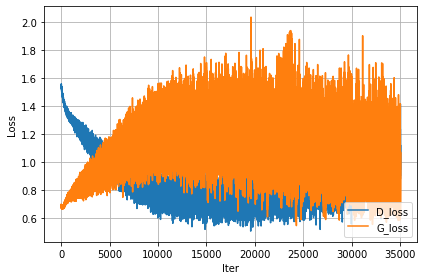

Epoch: [1002] [  30/  35] D_loss: 1.12190771, G_loss: 0.80051321
Epoch: [1002] completed	 D_loss: 1.11989141, G_loss: 0.74600625
Epoch: [1003] [  30/  35] D_loss: 1.09686518, G_loss: 0.74335027
Epoch: [1003] completed	 D_loss: 1.18004751, G_loss: 0.59190100
Epoch: [1004] [  30/  35] D_loss: 1.05038214, G_loss: 1.08479345
Epoch: [1004] completed	 D_loss: 0.99977958, G_loss: 1.02858758
Epoch: [1005] [  30/  35] D_loss: 1.08425498, G_loss: 1.27834284
Epoch: [1005] completed	 D_loss: 0.99467653, G_loss: 0.86404401
Epoch: [1006] [  30/  35] D_loss: 1.12657404, G_loss: 0.92341274
Epoch: [1006] completed	 D_loss: 1.28056252, G_loss: 0.69678217
Epoch: [1007] [  30/  35] D_loss: 0.97881496, G_loss: 0.77324730
Epoch: [1007] completed	 D_loss: 0.93600941, G_loss: 0.95383513
Epoch: [1008] [  30/  35] D_loss: 0.91356468, G_loss: 1.20483804
Epoch: [1008] completed	 D_loss: 1.02977562, G_loss: 0.73229730
Epoch: [1009] [  30/  35] D_loss: 0.97064108, G_loss: 0.92142361
Epoch: [1009] completed	 D_loss:

Epoch: [1066] [  30/  35] D_loss: 1.15818429, G_loss: 0.75663519
Epoch: [1066] completed	 D_loss: 1.25028944, G_loss: 0.90556037
Epoch: [1067] [  30/  35] D_loss: 1.27396655, G_loss: 0.63308752
Epoch: [1067] completed	 D_loss: 1.05890036, G_loss: 1.18350005
Epoch: [1068] [  30/  35] D_loss: 0.91187370, G_loss: 1.06228185
Epoch: [1068] completed	 D_loss: 1.00430894, G_loss: 0.92301476
Epoch: [1069] [  30/  35] D_loss: 1.30789363, G_loss: 1.04513955
Epoch: [1069] completed	 D_loss: 0.91329229, G_loss: 1.18702996
Epoch: [1070] [  30/  35] D_loss: 1.07493269, G_loss: 1.12862909
Epoch: [1070] completed	 D_loss: 0.83755732, G_loss: 1.00859785
Epoch: [1071] [  30/  35] D_loss: 1.25980413, G_loss: 0.91305774
Epoch: [1071] completed	 D_loss: 0.97854996, G_loss: 0.95759857
Epoch: [1072] [  30/  35] D_loss: 1.04171801, G_loss: 0.87222946
Epoch: [1072] completed	 D_loss: 0.91524893, G_loss: 0.92413491
Epoch: [1073] [  30/  35] D_loss: 1.14451492, G_loss: 0.72995496
Epoch: [1073] completed	 D_loss:

Epoch: [1102] [  30/  35] D_loss: 1.17501175, G_loss: 0.68381065
Epoch: [1102] completed	 D_loss: 1.10962152, G_loss: 1.01349115
Epoch: [1103] [  30/  35] D_loss: 0.85137820, G_loss: 1.08017981
Epoch: [1103] completed	 D_loss: 1.19338489, G_loss: 0.77848482
Epoch: [1104] [  30/  35] D_loss: 0.71750009, G_loss: 1.25237739
Epoch: [1104] completed	 D_loss: 1.12993109, G_loss: 0.74693310
Epoch: [1105] [  30/  35] D_loss: 1.20567822, G_loss: 1.21873128
Epoch: [1105] completed	 D_loss: 1.03619480, G_loss: 0.80178809
Epoch: [1106] [  30/  35] D_loss: 0.96486354, G_loss: 1.03140545
Epoch: [1106] completed	 D_loss: 1.21185744, G_loss: 0.72708154
Epoch: [1107] [  30/  35] D_loss: 1.13164437, G_loss: 0.76265341
Epoch: [1107] completed	 D_loss: 1.24274600, G_loss: 1.27754712
Epoch: [1108] [  30/  35] D_loss: 1.24340248, G_loss: 0.94440305
Epoch: [1108] completed	 D_loss: 1.13956487, G_loss: 0.74781448
Epoch: [1109] [  30/  35] D_loss: 1.11214256, G_loss: 0.89127827
Epoch: [1109] completed	 D_loss:

Epoch: [1166] [  30/  35] D_loss: 1.05347073, G_loss: 0.87404281
Epoch: [1166] completed	 D_loss: 1.38897526, G_loss: 0.85596979
Epoch: [1167] [  30/  35] D_loss: 1.21118093, G_loss: 0.80038989
Epoch: [1167] completed	 D_loss: 1.09590006, G_loss: 0.95623755
Epoch: [1168] [  30/  35] D_loss: 1.07864928, G_loss: 0.90167624
Epoch: [1168] completed	 D_loss: 1.03858292, G_loss: 0.93717778
Epoch: [1169] [  30/  35] D_loss: 1.30549824, G_loss: 1.14965653
Epoch: [1169] completed	 D_loss: 1.58637369, G_loss: 1.12686181
Epoch: [1170] [  30/  35] D_loss: 1.16646075, G_loss: 0.76110029
Epoch: [1170] completed	 D_loss: 1.04149246, G_loss: 1.08806968
Epoch: [1171] [  30/  35] D_loss: 1.46638751, G_loss: 0.69598502
Epoch: [1171] completed	 D_loss: 1.16127741, G_loss: 1.13926041
Epoch: [1172] [  30/  35] D_loss: 0.91631222, G_loss: 0.83639807
Epoch: [1172] completed	 D_loss: 1.07221377, G_loss: 1.00778925
Epoch: [1173] [  30/  35] D_loss: 1.09823608, G_loss: 0.81163824
Epoch: [1173] completed	 D_loss:

Epoch: [1202] [  30/  35] D_loss: 1.52138221, G_loss: 1.18404949
Epoch: [1202] completed	 D_loss: 1.17213130, G_loss: 0.94094944
Epoch: [1203] [  30/  35] D_loss: 1.21494579, G_loss: 0.67641407
Epoch: [1203] completed	 D_loss: 1.20279002, G_loss: 0.72801244
Epoch: [1204] [  30/  35] D_loss: 1.38845015, G_loss: 1.05113256
Epoch: [1204] completed	 D_loss: 1.15083325, G_loss: 1.19832277
Epoch: [1205] [  30/  35] D_loss: 1.28575361, G_loss: 0.72396863
Epoch: [1205] completed	 D_loss: 0.98629117, G_loss: 1.01577926
Epoch: [1206] [  30/  35] D_loss: 1.21472669, G_loss: 0.92942744
Epoch: [1206] completed	 D_loss: 1.31296349, G_loss: 1.06294346
Epoch: [1207] [  30/  35] D_loss: 1.28985405, G_loss: 0.79936022
Epoch: [1207] completed	 D_loss: 1.27940083, G_loss: 0.67788541
Epoch: [1208] [  30/  35] D_loss: 1.27827644, G_loss: 0.67394805
Epoch: [1208] completed	 D_loss: 1.28878188, G_loss: 0.91665930
Epoch: [1209] [  30/  35] D_loss: 1.22947478, G_loss: 0.82886827
Epoch: [1209] completed	 D_loss:

Epoch: [1266] [  30/  35] D_loss: 1.17907739, G_loss: 0.76158071
Epoch: [1266] completed	 D_loss: 1.41703439, G_loss: 0.56388891
Epoch: [1267] [  30/  35] D_loss: 1.14683938, G_loss: 0.60611421
Epoch: [1267] completed	 D_loss: 1.28926885, G_loss: 0.61158377
Epoch: [1268] [  30/  35] D_loss: 1.35730338, G_loss: 0.66285121
Epoch: [1268] completed	 D_loss: 1.27797699, G_loss: 0.65155005
Epoch: [1269] [  30/  35] D_loss: 1.21610177, G_loss: 0.68582600
Epoch: [1269] completed	 D_loss: 1.26475549, G_loss: 0.93506169
Epoch: [1270] [  30/  35] D_loss: 1.10853612, G_loss: 0.69220138
Epoch: [1270] completed	 D_loss: 1.25643182, G_loss: 0.54579067
Epoch: [1271] [  30/  35] D_loss: 1.18957388, G_loss: 0.98242766
Epoch: [1271] completed	 D_loss: 1.21265769, G_loss: 0.78201741
Epoch: [1272] [  30/  35] D_loss: 1.24185729, G_loss: 0.74940097
Epoch: [1272] completed	 D_loss: 1.32918310, G_loss: 0.58381331
Epoch: [1273] [  30/  35] D_loss: 1.13361359, G_loss: 0.97149163
Epoch: [1273] completed	 D_loss:

Epoch: [1302] [  30/  35] D_loss: 1.15354609, G_loss: 0.70293528
Epoch: [1302] completed	 D_loss: 1.23500729, G_loss: 0.74008405
Epoch: [1303] [  30/  35] D_loss: 1.07442153, G_loss: 0.79673290
Epoch: [1303] completed	 D_loss: 1.21053433, G_loss: 0.73831427
Epoch: [1304] [  30/  35] D_loss: 1.55072498, G_loss: 0.69250733
Epoch: [1304] completed	 D_loss: 1.20587707, G_loss: 0.83558077
Epoch: [1305] [  30/  35] D_loss: 1.16373420, G_loss: 0.96424317
Epoch: [1305] completed	 D_loss: 1.02229917, G_loss: 0.78151071
Epoch: [1306] [  30/  35] D_loss: 1.24403918, G_loss: 0.75379515
Epoch: [1306] completed	 D_loss: 1.09146905, G_loss: 0.83494520
Epoch: [1307] [  30/  35] D_loss: 1.31818938, G_loss: 0.78229046
Epoch: [1307] completed	 D_loss: 1.45431948, G_loss: 0.80619228
Epoch: [1308] [  30/  35] D_loss: 1.11591578, G_loss: 0.87380284
Epoch: [1308] completed	 D_loss: 1.27475023, G_loss: 0.69524467
Epoch: [1309] [  30/  35] D_loss: 1.37723804, G_loss: 0.69441724
Epoch: [1309] completed	 D_loss:

Epoch: [1366] [  30/  35] D_loss: 1.47263050, G_loss: 0.53244060
Epoch: [1366] completed	 D_loss: 1.41841578, G_loss: 0.55850357
Epoch: [1367] [  30/  35] D_loss: 1.40273547, G_loss: 0.86120647
Epoch: [1367] completed	 D_loss: 1.42195976, G_loss: 0.67153770
Epoch: [1368] [  30/  35] D_loss: 1.58550799, G_loss: 0.58258623
Epoch: [1368] completed	 D_loss: 1.31121433, G_loss: 0.71503079
Epoch: [1369] [  30/  35] D_loss: 1.44960213, G_loss: 1.00173187
Epoch: [1369] completed	 D_loss: 1.21439540, G_loss: 0.72951019
Epoch: [1370] [  30/  35] D_loss: 1.19487309, G_loss: 0.81307411
Epoch: [1370] completed	 D_loss: 1.28643894, G_loss: 0.68084818
Epoch: [1371] [  30/  35] D_loss: 1.29374146, G_loss: 0.72130108
Epoch: [1371] completed	 D_loss: 1.29156363, G_loss: 0.69678473
Epoch: [1372] [  30/  35] D_loss: 1.34329629, G_loss: 0.99461055
Epoch: [1372] completed	 D_loss: 1.37500668, G_loss: 0.62467372
Epoch: [1373] [  30/  35] D_loss: 1.57387829, G_loss: 0.78589606
Epoch: [1373] completed	 D_loss:

Epoch: [1402] [  30/  35] D_loss: 1.31339490, G_loss: 0.72440308
Epoch: [1402] completed	 D_loss: 1.33996964, G_loss: 0.68747145
Epoch: [1403] [  30/  35] D_loss: 1.33841157, G_loss: 0.58201534
Epoch: [1403] completed	 D_loss: 1.24223316, G_loss: 0.83862042
Epoch: [1404] [  30/  35] D_loss: 1.36099458, G_loss: 0.86891812
Epoch: [1404] completed	 D_loss: 1.07667124, G_loss: 1.00232220
Epoch: [1405] [  30/  35] D_loss: 1.43428445, G_loss: 0.62446845
Epoch: [1405] completed	 D_loss: 1.22852588, G_loss: 0.97949469
Epoch: [1406] [  30/  35] D_loss: 1.35544717, G_loss: 0.79512191
Epoch: [1406] completed	 D_loss: 1.31072974, G_loss: 1.02839267
Epoch: [1407] [  30/  35] D_loss: 1.43314278, G_loss: 0.75025713
Epoch: [1407] completed	 D_loss: 1.15179443, G_loss: 0.84280241
Epoch: [1408] [  30/  35] D_loss: 1.30870295, G_loss: 0.78454822
Epoch: [1408] completed	 D_loss: 1.46015573, G_loss: 0.78105873
Epoch: [1409] [  30/  35] D_loss: 1.49602962, G_loss: 0.54355866
Epoch: [1409] completed	 D_loss:

Epoch: [1466] [  30/  35] D_loss: 1.49020875, G_loss: 0.57059300
Epoch: [1466] completed	 D_loss: 1.33622444, G_loss: 0.59822315
Epoch: [1467] [  30/  35] D_loss: 1.46604514, G_loss: 0.71540201
Epoch: [1467] completed	 D_loss: 1.39985681, G_loss: 1.05466890
Epoch: [1468] [  30/  35] D_loss: 1.64936161, G_loss: 0.95297426
Epoch: [1468] completed	 D_loss: 1.20227742, G_loss: 0.75921458
Epoch: [1469] [  30/  35] D_loss: 1.22785759, G_loss: 0.67923343
Epoch: [1469] completed	 D_loss: 1.43177056, G_loss: 0.70623678
Epoch: [1470] [  30/  35] D_loss: 1.40846920, G_loss: 0.77438134
Epoch: [1470] completed	 D_loss: 1.37000132, G_loss: 0.81649625
Epoch: [1471] [  30/  35] D_loss: 1.33176708, G_loss: 0.69123507
Epoch: [1471] completed	 D_loss: 1.28617811, G_loss: 0.87157726
Epoch: [1472] [  30/  35] D_loss: 1.14375198, G_loss: 0.71561348
Epoch: [1472] completed	 D_loss: 1.31719184, G_loss: 0.74605453
Epoch: [1473] [  30/  35] D_loss: 1.37297618, G_loss: 0.75878108
Epoch: [1473] completed	 D_loss:

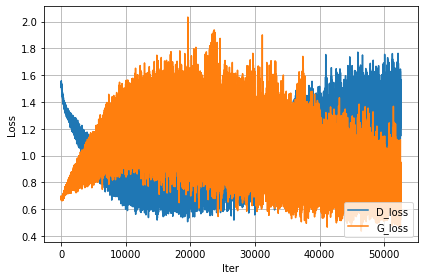

Epoch: [1502] [  30/  35] D_loss: 1.15252316, G_loss: 0.69580007
Epoch: [1502] completed	 D_loss: 1.48114395, G_loss: 0.68643653
Epoch: [1503] [  30/  35] D_loss: 1.31692243, G_loss: 0.55980670
Epoch: [1503] completed	 D_loss: 1.42361474, G_loss: 0.67881560
Epoch: [1504] [  30/  35] D_loss: 1.39146519, G_loss: 0.73485082
Epoch: [1504] completed	 D_loss: 1.31110990, G_loss: 0.61823660
Epoch: [1505] [  30/  35] D_loss: 1.30437326, G_loss: 0.74156410
Epoch: [1505] completed	 D_loss: 1.31382191, G_loss: 0.62130010
Epoch: [1506] [  30/  35] D_loss: 1.22577107, G_loss: 0.74778348
Epoch: [1506] completed	 D_loss: 1.51077640, G_loss: 0.81476337
Epoch: [1507] [  30/  35] D_loss: 1.35720170, G_loss: 0.67259842
Epoch: [1507] completed	 D_loss: 1.39872241, G_loss: 0.86917806
Epoch: [1508] [  30/  35] D_loss: 1.27555418, G_loss: 0.91654664
Epoch: [1508] completed	 D_loss: 1.25778592, G_loss: 0.58644634
Epoch: [1509] [  30/  35] D_loss: 1.30470169, G_loss: 0.79466552
Epoch: [1509] completed	 D_loss:

Epoch: [1566] [  30/  35] D_loss: 1.44125640, G_loss: 0.72059244
Epoch: [1566] completed	 D_loss: 1.39133310, G_loss: 0.61869431
Epoch: [1567] [  30/  35] D_loss: 1.47575164, G_loss: 0.55936384
Epoch: [1567] completed	 D_loss: 1.37447989, G_loss: 0.59314287
Epoch: [1568] [  30/  35] D_loss: 1.38915992, G_loss: 0.66920775
Epoch: [1568] completed	 D_loss: 1.21490049, G_loss: 0.76078701
Epoch: [1569] [  30/  35] D_loss: 1.54368639, G_loss: 0.57294399
Epoch: [1569] completed	 D_loss: 1.36454701, G_loss: 0.68396628
Epoch: [1570] [  30/  35] D_loss: 1.33282566, G_loss: 0.64173579
Epoch: [1570] completed	 D_loss: 1.30495405, G_loss: 0.59479278
Epoch: [1571] [  30/  35] D_loss: 1.22553778, G_loss: 0.63810056
Epoch: [1571] completed	 D_loss: 1.52797055, G_loss: 0.55765736
Epoch: [1572] [  30/  35] D_loss: 1.52820802, G_loss: 0.52870488
Epoch: [1572] completed	 D_loss: 1.34174287, G_loss: 0.87105280
Epoch: [1573] [  30/  35] D_loss: 1.45411086, G_loss: 0.67316532
Epoch: [1573] completed	 D_loss:

Epoch: [1602] [  30/  35] D_loss: 1.44183493, G_loss: 0.63168204
Epoch: [1602] completed	 D_loss: 1.49692440, G_loss: 0.57012618
Epoch: [1603] [  30/  35] D_loss: 1.47629774, G_loss: 0.63590962
Epoch: [1603] completed	 D_loss: 1.26287222, G_loss: 0.77779359
Epoch: [1604] [  30/  35] D_loss: 1.34764886, G_loss: 0.65470248
Epoch: [1604] completed	 D_loss: 1.48654485, G_loss: 0.74687618
Epoch: [1605] [  30/  35] D_loss: 1.36637175, G_loss: 0.72602487
Epoch: [1605] completed	 D_loss: 1.31495249, G_loss: 0.84923470
Epoch: [1606] [  30/  35] D_loss: 1.21714568, G_loss: 0.69410229
Epoch: [1606] completed	 D_loss: 1.50736773, G_loss: 0.60821790
Epoch: [1607] [  30/  35] D_loss: 1.49391389, G_loss: 0.50543147
Epoch: [1607] completed	 D_loss: 1.49542892, G_loss: 0.60458863
Epoch: [1608] [  30/  35] D_loss: 1.52602422, G_loss: 0.60804904
Epoch: [1608] completed	 D_loss: 1.24797916, G_loss: 0.83500946
Epoch: [1609] [  30/  35] D_loss: 1.43450534, G_loss: 0.75874555
Epoch: [1609] completed	 D_loss:

Epoch: [1666] [  30/  35] D_loss: 1.48053288, G_loss: 0.67772943
Epoch: [1666] completed	 D_loss: 1.41778874, G_loss: 0.93504411
Epoch: [1667] [  30/  35] D_loss: 1.35552025, G_loss: 0.62645549
Epoch: [1667] completed	 D_loss: 1.30565810, G_loss: 1.01319504
Epoch: [1668] [  30/  35] D_loss: 1.48868322, G_loss: 0.57633996
Epoch: [1668] completed	 D_loss: 1.32874382, G_loss: 0.87216115
Epoch: [1669] [  30/  35] D_loss: 1.39718008, G_loss: 0.65106410
Epoch: [1669] completed	 D_loss: 1.66807854, G_loss: 0.75420159
Epoch: [1670] [  30/  35] D_loss: 1.39787769, G_loss: 0.63373464
Epoch: [1670] completed	 D_loss: 1.42108452, G_loss: 0.58323646
Epoch: [1671] [  30/  35] D_loss: 1.42369401, G_loss: 0.66466737
Epoch: [1671] completed	 D_loss: 1.26406777, G_loss: 0.76112902
Epoch: [1672] [  30/  35] D_loss: 1.55602574, G_loss: 0.55420464
Epoch: [1672] completed	 D_loss: 1.44546032, G_loss: 0.76090235
Epoch: [1673] [  30/  35] D_loss: 1.48000908, G_loss: 0.59268016
Epoch: [1673] completed	 D_loss:

Epoch: [1702] [  30/  35] D_loss: 1.38310552, G_loss: 0.71817392
Epoch: [1702] completed	 D_loss: 1.49001622, G_loss: 0.82917923
Epoch: [1703] [  30/  35] D_loss: 1.45806479, G_loss: 0.53837138
Epoch: [1703] completed	 D_loss: 1.54963136, G_loss: 0.72469389
Epoch: [1704] [  30/  35] D_loss: 1.37968063, G_loss: 0.58762878
Epoch: [1704] completed	 D_loss: 1.36149967, G_loss: 0.53498411
Epoch: [1705] [  30/  35] D_loss: 1.47085822, G_loss: 0.59981871
Epoch: [1705] completed	 D_loss: 1.35266137, G_loss: 0.79103476
Epoch: [1706] [  30/  35] D_loss: 1.27700925, G_loss: 0.65268213
Epoch: [1706] completed	 D_loss: 1.28933668, G_loss: 0.69364721
Epoch: [1707] [  30/  35] D_loss: 1.13576913, G_loss: 0.88852680
Epoch: [1707] completed	 D_loss: 1.20922136, G_loss: 0.72671235
Epoch: [1708] [  30/  35] D_loss: 1.42203248, G_loss: 0.60756052
Epoch: [1708] completed	 D_loss: 1.54485726, G_loss: 0.62612891
Epoch: [1709] [  30/  35] D_loss: 1.52317858, G_loss: 0.60527700
Epoch: [1709] completed	 D_loss:

Epoch: [1766] [  30/  35] D_loss: 1.48112249, G_loss: 0.69718331
Epoch: [1766] completed	 D_loss: 1.58221638, G_loss: 0.64949763
Epoch: [1767] [  30/  35] D_loss: 1.42680573, G_loss: 0.68140888
Epoch: [1767] completed	 D_loss: 1.49228191, G_loss: 0.71954894
Epoch: [1768] [  30/  35] D_loss: 1.38074088, G_loss: 0.68403828
Epoch: [1768] completed	 D_loss: 1.48125470, G_loss: 0.55424768
Epoch: [1769] [  30/  35] D_loss: 1.34231234, G_loss: 0.67288870
Epoch: [1769] completed	 D_loss: 1.47353935, G_loss: 0.70195299
Epoch: [1770] [  30/  35] D_loss: 1.29939318, G_loss: 0.65320444
Epoch: [1770] completed	 D_loss: 1.41359198, G_loss: 0.72632790
Epoch: [1771] [  30/  35] D_loss: 1.47013235, G_loss: 0.63093138
Epoch: [1771] completed	 D_loss: 1.28251243, G_loss: 0.71822214
Epoch: [1772] [  30/  35] D_loss: 1.51691926, G_loss: 0.82619095
Epoch: [1772] completed	 D_loss: 1.48914766, G_loss: 0.60986644
Epoch: [1773] [  30/  35] D_loss: 1.40378714, G_loss: 0.62703443
Epoch: [1773] completed	 D_loss:

Epoch: [1802] [  30/  35] D_loss: 1.46657324, G_loss: 0.74774551
Epoch: [1802] completed	 D_loss: 1.51540220, G_loss: 0.65000111
Epoch: [1803] [  30/  35] D_loss: 1.39699197, G_loss: 0.61667323
Epoch: [1803] completed	 D_loss: 1.29988623, G_loss: 0.61467457
Epoch: [1804] [  30/  35] D_loss: 1.41957903, G_loss: 0.56763947
Epoch: [1804] completed	 D_loss: 1.48752213, G_loss: 0.83080131
Epoch: [1805] [  30/  35] D_loss: 1.39968514, G_loss: 0.68319273
Epoch: [1805] completed	 D_loss: 1.44396937, G_loss: 0.79901707
Epoch: [1806] [  30/  35] D_loss: 1.46615171, G_loss: 0.80727136
Epoch: [1806] completed	 D_loss: 1.49653494, G_loss: 0.65619373
Epoch: [1807] [  30/  35] D_loss: 1.24397397, G_loss: 0.76881069
Epoch: [1807] completed	 D_loss: 1.62527800, G_loss: 0.69343102
Epoch: [1808] [  30/  35] D_loss: 1.55365598, G_loss: 0.56178308
Epoch: [1808] completed	 D_loss: 1.44387519, G_loss: 0.63793862
Epoch: [1809] [  30/  35] D_loss: 1.48608708, G_loss: 0.71898514
Epoch: [1809] completed	 D_loss:

Epoch: [1866] [  30/  35] D_loss: 1.47631395, G_loss: 0.69725704
Epoch: [1866] completed	 D_loss: 1.44861078, G_loss: 0.68707740
Epoch: [1867] [  30/  35] D_loss: 1.41939032, G_loss: 0.64142144
Epoch: [1867] completed	 D_loss: 1.41118002, G_loss: 0.59796059
Epoch: [1868] [  30/  35] D_loss: 1.40427923, G_loss: 0.70763093
Epoch: [1868] completed	 D_loss: 1.54844570, G_loss: 0.71324247
Epoch: [1869] [  30/  35] D_loss: 1.25951183, G_loss: 0.65100962
Epoch: [1869] completed	 D_loss: 1.47048330, G_loss: 0.68329328
Epoch: [1870] [  30/  35] D_loss: 1.25012207, G_loss: 0.65512037
Epoch: [1870] completed	 D_loss: 1.50478148, G_loss: 0.63470995
Epoch: [1871] [  30/  35] D_loss: 1.48288393, G_loss: 0.65815729
Epoch: [1871] completed	 D_loss: 1.51652050, G_loss: 0.63620770
Epoch: [1872] [  30/  35] D_loss: 1.41049433, G_loss: 0.67670268
Epoch: [1872] completed	 D_loss: 1.56574368, G_loss: 0.65922332
Epoch: [1873] [  30/  35] D_loss: 1.45339465, G_loss: 0.64807868
Epoch: [1873] completed	 D_loss:

Epoch: [1902] [  30/  35] D_loss: 1.41066432, G_loss: 0.67449522
Epoch: [1902] completed	 D_loss: 1.47851706, G_loss: 0.63557422
Epoch: [1903] [  30/  35] D_loss: 1.55938721, G_loss: 0.60202336
Epoch: [1903] completed	 D_loss: 1.47595274, G_loss: 0.61383897
Epoch: [1904] [  30/  35] D_loss: 1.30446553, G_loss: 0.71611816
Epoch: [1904] completed	 D_loss: 1.49114454, G_loss: 0.64640260
Epoch: [1905] [  30/  35] D_loss: 1.46004474, G_loss: 0.64621007
Epoch: [1905] completed	 D_loss: 1.38490522, G_loss: 0.61222607
Epoch: [1906] [  30/  35] D_loss: 1.34038830, G_loss: 0.64161980
Epoch: [1906] completed	 D_loss: 1.56517553, G_loss: 0.71918178
Epoch: [1907] [  30/  35] D_loss: 1.41152644, G_loss: 0.65135133
Epoch: [1907] completed	 D_loss: 1.56403303, G_loss: 0.63218307
Epoch: [1908] [  30/  35] D_loss: 1.48964453, G_loss: 0.68286049
Epoch: [1908] completed	 D_loss: 1.46516991, G_loss: 0.62115705
Epoch: [1909] [  30/  35] D_loss: 1.51590514, G_loss: 0.71949404
Epoch: [1909] completed	 D_loss:

Epoch: [1966] [  30/  35] D_loss: 1.49195004, G_loss: 0.61689526
Epoch: [1966] completed	 D_loss: 1.49321437, G_loss: 0.64000404
Epoch: [1967] [  30/  35] D_loss: 1.48114622, G_loss: 0.59130913
Epoch: [1967] completed	 D_loss: 1.40602946, G_loss: 0.73533720
Epoch: [1968] [  30/  35] D_loss: 1.34042132, G_loss: 0.58963400
Epoch: [1968] completed	 D_loss: 1.51072180, G_loss: 0.59912783
Epoch: [1969] [  30/  35] D_loss: 1.42999744, G_loss: 0.65612286
Epoch: [1969] completed	 D_loss: 1.44345963, G_loss: 0.62156492
Epoch: [1970] [  30/  35] D_loss: 1.43994141, G_loss: 0.64306778
Epoch: [1970] completed	 D_loss: 1.50344181, G_loss: 0.69927424
Epoch: [1971] [  30/  35] D_loss: 1.47654581, G_loss: 0.62386382
Epoch: [1971] completed	 D_loss: 1.37308741, G_loss: 0.67060566
Epoch: [1972] [  30/  35] D_loss: 1.52688599, G_loss: 0.73318273
Epoch: [1972] completed	 D_loss: 1.39763498, G_loss: 0.70219445
Epoch: [1973] [  30/  35] D_loss: 1.51531744, G_loss: 0.61832923
Epoch: [1973] completed	 D_loss:

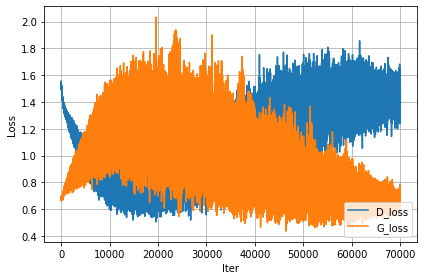

Epoch: [2002] [  30/  35] D_loss: 1.47536469, G_loss: 0.63024497
Epoch: [2002] completed	 D_loss: 1.45928812, G_loss: 0.67791712
Epoch: [2003] [  30/  35] D_loss: 1.53138828, G_loss: 0.64219236
Epoch: [2003] completed	 D_loss: 1.38488936, G_loss: 0.69739842
Epoch: [2004] [  30/  35] D_loss: 1.43282819, G_loss: 0.71562946
Epoch: [2004] completed	 D_loss: 1.57670391, G_loss: 0.62576604
Epoch: [2005] [  30/  35] D_loss: 1.51045966, G_loss: 0.65519381
Epoch: [2005] completed	 D_loss: 1.44755042, G_loss: 0.65685672
Epoch: [2006] [  30/  35] D_loss: 1.52891207, G_loss: 0.63271809
Epoch: [2006] completed	 D_loss: 1.52320528, G_loss: 0.65281439
Epoch: [2007] [  30/  35] D_loss: 1.44542623, G_loss: 0.69153214
Epoch: [2007] completed	 D_loss: 1.49353552, G_loss: 0.62567008
Epoch: [2008] [  30/  35] D_loss: 1.55628085, G_loss: 0.73856229
Epoch: [2008] completed	 D_loss: 1.54177737, G_loss: 0.63767743
Epoch: [2009] [  30/  35] D_loss: 1.49838185, G_loss: 0.61291820
Epoch: [2009] completed	 D_loss:

Epoch: [2066] [  30/  35] D_loss: 1.43515861, G_loss: 0.63615400
Epoch: [2066] completed	 D_loss: 1.43151844, G_loss: 0.63312447
Epoch: [2067] [  30/  35] D_loss: 1.30540681, G_loss: 0.68833536
Epoch: [2067] completed	 D_loss: 1.53703141, G_loss: 0.62475139
Epoch: [2068] [  30/  35] D_loss: 1.44526744, G_loss: 0.67227638
Epoch: [2068] completed	 D_loss: 1.45529556, G_loss: 0.64048362
Epoch: [2069] [  30/  35] D_loss: 1.42538643, G_loss: 0.63281250
Epoch: [2069] completed	 D_loss: 1.36623836, G_loss: 0.72917801
Epoch: [2070] [  30/  35] D_loss: 1.37911069, G_loss: 0.61236179
Epoch: [2070] completed	 D_loss: 1.41226673, G_loss: 0.70369351
Epoch: [2071] [  30/  35] D_loss: 1.51699424, G_loss: 0.63055605
Epoch: [2071] completed	 D_loss: 1.33821702, G_loss: 0.63048893
Epoch: [2072] [  30/  35] D_loss: 1.46319842, G_loss: 0.61848390
Epoch: [2072] completed	 D_loss: 1.50723398, G_loss: 0.61519712
Epoch: [2073] [  30/  35] D_loss: 1.43515468, G_loss: 0.65263450
Epoch: [2073] completed	 D_loss:

Epoch: [2102] [  30/  35] D_loss: 1.48373616, G_loss: 0.66093940
Epoch: [2102] completed	 D_loss: 1.47217739, G_loss: 0.63778967
Epoch: [2103] [  30/  35] D_loss: 1.45088887, G_loss: 0.65563631
Epoch: [2103] completed	 D_loss: 1.45223284, G_loss: 0.62733829
Epoch: [2104] [  30/  35] D_loss: 1.42237341, G_loss: 0.64779466
Epoch: [2104] completed	 D_loss: 1.40508831, G_loss: 0.67227077
Epoch: [2105] [  30/  35] D_loss: 1.37386560, G_loss: 0.69890946
Epoch: [2105] completed	 D_loss: 1.41490507, G_loss: 0.68057364
Epoch: [2106] [  30/  35] D_loss: 1.53071928, G_loss: 0.68943256
Epoch: [2106] completed	 D_loss: 1.40687180, G_loss: 0.72351670
Epoch: [2107] [  30/  35] D_loss: 1.42308831, G_loss: 0.67331535
Epoch: [2107] completed	 D_loss: 1.45767772, G_loss: 0.63882267
Epoch: [2108] [  30/  35] D_loss: 1.46254826, G_loss: 0.70391637
Epoch: [2108] completed	 D_loss: 1.46893001, G_loss: 0.67178339
Epoch: [2109] [  30/  35] D_loss: 1.45794189, G_loss: 0.63835239
Epoch: [2109] completed	 D_loss:

Epoch: [2166] [  30/  35] D_loss: 1.43532622, G_loss: 0.68301040
Epoch: [2166] completed	 D_loss: 1.44976521, G_loss: 0.65506113
Epoch: [2167] [  30/  35] D_loss: 1.45917809, G_loss: 0.63419843
Epoch: [2167] completed	 D_loss: 1.45959949, G_loss: 0.66905612
Epoch: [2168] [  30/  35] D_loss: 1.41838157, G_loss: 0.68430233
Epoch: [2168] completed	 D_loss: 1.43837500, G_loss: 0.65784383
Epoch: [2169] [  30/  35] D_loss: 1.46089268, G_loss: 0.66506469
Epoch: [2169] completed	 D_loss: 1.46938837, G_loss: 0.64422452
Epoch: [2170] [  30/  35] D_loss: 1.46369731, G_loss: 0.66616809
Epoch: [2170] completed	 D_loss: 1.40778112, G_loss: 0.69550502
Epoch: [2171] [  30/  35] D_loss: 1.48492599, G_loss: 0.65352833
Epoch: [2171] completed	 D_loss: 1.46409702, G_loss: 0.64725363
Epoch: [2172] [  30/  35] D_loss: 1.37918687, G_loss: 0.64853716
Epoch: [2172] completed	 D_loss: 1.51965344, G_loss: 0.65198618
Epoch: [2173] [  30/  35] D_loss: 1.46211898, G_loss: 0.67106402
Epoch: [2173] completed	 D_loss:

Epoch: [2202] [  30/  35] D_loss: 1.44598317, G_loss: 0.64755136
Epoch: [2202] completed	 D_loss: 1.46342540, G_loss: 0.65973920
Epoch: [2203] [  30/  35] D_loss: 1.46025193, G_loss: 0.64858019
Epoch: [2203] completed	 D_loss: 1.45118976, G_loss: 0.64105928
Epoch: [2204] [  30/  35] D_loss: 1.47726691, G_loss: 0.66300207
Epoch: [2204] completed	 D_loss: 1.50236642, G_loss: 0.65065211
Epoch: [2205] [  30/  35] D_loss: 1.38797867, G_loss: 0.65928268
Epoch: [2205] completed	 D_loss: 1.46118951, G_loss: 0.64362532
Epoch: [2206] [  30/  35] D_loss: 1.46027827, G_loss: 0.63650042
Epoch: [2206] completed	 D_loss: 1.47357857, G_loss: 0.64986527
Epoch: [2207] [  30/  35] D_loss: 1.46618891, G_loss: 0.65177536
Epoch: [2207] completed	 D_loss: 1.49061763, G_loss: 0.65040505
Epoch: [2208] [  30/  35] D_loss: 1.41527987, G_loss: 0.64414442
Epoch: [2208] completed	 D_loss: 1.44684148, G_loss: 0.64371490
Epoch: [2209] [  30/  35] D_loss: 1.40801096, G_loss: 0.66257071
Epoch: [2209] completed	 D_loss:

Epoch: [2266] [  30/  35] D_loss: 1.42678785, G_loss: 0.63894802
Epoch: [2266] completed	 D_loss: 1.43729639, G_loss: 0.65813857
Epoch: [2267] [  30/  35] D_loss: 1.43518710, G_loss: 0.68444544
Epoch: [2267] completed	 D_loss: 1.42674863, G_loss: 0.63859987
Epoch: [2268] [  30/  35] D_loss: 1.47401214, G_loss: 0.64917213
Epoch: [2268] completed	 D_loss: 1.43626976, G_loss: 0.66678721
Epoch: [2269] [  30/  35] D_loss: 1.38332558, G_loss: 0.68364847
Epoch: [2269] completed	 D_loss: 1.45490921, G_loss: 0.67552167
Epoch: [2270] [  30/  35] D_loss: 1.46664739, G_loss: 0.65232503
Epoch: [2270] completed	 D_loss: 1.44011593, G_loss: 0.67267704
Epoch: [2271] [  30/  35] D_loss: 1.46103978, G_loss: 0.66314560
Epoch: [2271] completed	 D_loss: 1.38250637, G_loss: 0.66748351
Epoch: [2272] [  30/  35] D_loss: 1.48594904, G_loss: 0.63300091
Epoch: [2272] completed	 D_loss: 1.45440006, G_loss: 0.64948678
Epoch: [2273] [  30/  35] D_loss: 1.41581142, G_loss: 0.66156799
Epoch: [2273] completed	 D_loss:

Epoch: [2302] [  30/  35] D_loss: 1.42412353, G_loss: 0.65772992
Epoch: [2302] completed	 D_loss: 1.46658111, G_loss: 0.66937304
Epoch: [2303] [  30/  35] D_loss: 1.43542397, G_loss: 0.67222893
Epoch: [2303] completed	 D_loss: 1.43610001, G_loss: 0.66913944
Epoch: [2304] [  30/  35] D_loss: 1.40566003, G_loss: 0.66361839
Epoch: [2304] completed	 D_loss: 1.45108712, G_loss: 0.66649282
Epoch: [2305] [  30/  35] D_loss: 1.42986250, G_loss: 0.67167372
Epoch: [2305] completed	 D_loss: 1.43113530, G_loss: 0.66961795
Epoch: [2306] [  30/  35] D_loss: 1.42068052, G_loss: 0.66025573
Epoch: [2306] completed	 D_loss: 1.44594431, G_loss: 0.65549958
Epoch: [2307] [  30/  35] D_loss: 1.45059681, G_loss: 0.65522188
Epoch: [2307] completed	 D_loss: 1.44856882, G_loss: 0.66114879
Epoch: [2308] [  30/  35] D_loss: 1.40171683, G_loss: 0.65321237
Epoch: [2308] completed	 D_loss: 1.41662741, G_loss: 0.66595161
Epoch: [2309] [  30/  35] D_loss: 1.41139555, G_loss: 0.66676933
Epoch: [2309] completed	 D_loss:

Epoch: [2366] [  30/  35] D_loss: 1.44357157, G_loss: 0.64752173
Epoch: [2366] completed	 D_loss: 1.47466469, G_loss: 0.60723621
Epoch: [2367] [  30/  35] D_loss: 1.47796130, G_loss: 0.60590565
Epoch: [2367] completed	 D_loss: 1.47363472, G_loss: 0.62532598
Epoch: [2368] [  30/  35] D_loss: 1.52669287, G_loss: 0.58424813
Epoch: [2368] completed	 D_loss: 1.46080637, G_loss: 0.61548120
Epoch: [2369] [  30/  35] D_loss: 1.47264230, G_loss: 0.66583347
Epoch: [2369] completed	 D_loss: 1.38776433, G_loss: 0.66544735
Epoch: [2370] [  30/  35] D_loss: 1.50391400, G_loss: 0.62859583
Epoch: [2370] completed	 D_loss: 1.47407520, G_loss: 0.61779654
Epoch: [2371] [  30/  35] D_loss: 1.41216087, G_loss: 0.67885262
Epoch: [2371] completed	 D_loss: 1.45749927, G_loss: 0.63681400
Epoch: [2372] [  30/  35] D_loss: 1.41660273, G_loss: 0.65768045
Epoch: [2372] completed	 D_loss: 1.44574594, G_loss: 0.64046764
Epoch: [2373] [  30/  35] D_loss: 1.44281435, G_loss: 0.64826202
Epoch: [2373] completed	 D_loss:

Epoch: [2402] [  30/  35] D_loss: 1.44090915, G_loss: 0.67857546
Epoch: [2402] completed	 D_loss: 1.44787169, G_loss: 0.66698289
Epoch: [2403] [  30/  35] D_loss: 1.43158436, G_loss: 0.66259778
Epoch: [2403] completed	 D_loss: 1.46080649, G_loss: 0.66493881
Epoch: [2404] [  30/  35] D_loss: 1.42141783, G_loss: 0.67444593
Epoch: [2404] completed	 D_loss: 1.44411016, G_loss: 0.68659681
Epoch: [2405] [  30/  35] D_loss: 1.41199696, G_loss: 0.67410213
Epoch: [2405] completed	 D_loss: 1.40951395, G_loss: 0.67579108
Epoch: [2406] [  30/  35] D_loss: 1.43501949, G_loss: 0.67771584
Epoch: [2406] completed	 D_loss: 1.42555308, G_loss: 0.67085820
Epoch: [2407] [  30/  35] D_loss: 1.41146731, G_loss: 0.66844749
Epoch: [2407] completed	 D_loss: 1.41182601, G_loss: 0.67603987
Epoch: [2408] [  30/  35] D_loss: 1.43378258, G_loss: 0.65783018
Epoch: [2408] completed	 D_loss: 1.41488194, G_loss: 0.66732985
Epoch: [2409] [  30/  35] D_loss: 1.43937171, G_loss: 0.66444939
Epoch: [2409] completed	 D_loss:

Epoch: [2466] [  30/  35] D_loss: 1.40309918, G_loss: 0.66097832
Epoch: [2466] completed	 D_loss: 1.41801000, G_loss: 0.68598616
Epoch: [2467] [  30/  35] D_loss: 1.39434922, G_loss: 0.67698312
Epoch: [2467] completed	 D_loss: 1.40324795, G_loss: 0.66785270
Epoch: [2468] [  30/  35] D_loss: 1.41806221, G_loss: 0.67238635
Epoch: [2468] completed	 D_loss: 1.38858128, G_loss: 0.67068702
Epoch: [2469] [  30/  35] D_loss: 1.39902198, G_loss: 0.66718167
Epoch: [2469] completed	 D_loss: 1.40996504, G_loss: 0.67936611
Epoch: [2470] [  30/  35] D_loss: 1.41284156, G_loss: 0.66470104
Epoch: [2470] completed	 D_loss: 1.43423498, G_loss: 0.67877108
Epoch: [2471] [  30/  35] D_loss: 1.40392733, G_loss: 0.65528983
Epoch: [2471] completed	 D_loss: 1.41427159, G_loss: 0.66546977
Epoch: [2472] [  30/  35] D_loss: 1.42279553, G_loss: 0.64523339
Epoch: [2472] completed	 D_loss: 1.41236925, G_loss: 0.66457438
Epoch: [2473] [  30/  35] D_loss: 1.39934993, G_loss: 0.65016526
Epoch: [2473] completed	 D_loss:

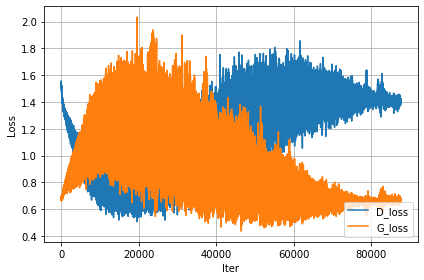

Epoch: [2502] [  30/  35] D_loss: 1.42403436, G_loss: 0.66790581
Epoch: [2502] completed	 D_loss: 1.42279792, G_loss: 0.65232533
Epoch: [2503] [  30/  35] D_loss: 1.42285919, G_loss: 0.67275804
Epoch: [2503] completed	 D_loss: 1.42150140, G_loss: 0.63734835
Epoch: [2504] [  30/  35] D_loss: 1.40753460, G_loss: 0.66159308
Epoch: [2504] completed	 D_loss: 1.41944218, G_loss: 0.65895140
Epoch: [2505] [  30/  35] D_loss: 1.42162561, G_loss: 0.65733302
Epoch: [2505] completed	 D_loss: 1.39386106, G_loss: 0.66889942
Epoch: [2506] [  30/  35] D_loss: 1.38567913, G_loss: 0.68166518
Epoch: [2506] completed	 D_loss: 1.38369274, G_loss: 0.66202986
Epoch: [2507] [  30/  35] D_loss: 1.38960052, G_loss: 0.66603982
Epoch: [2507] completed	 D_loss: 1.41053796, G_loss: 0.69349897
Epoch: [2508] [  30/  35] D_loss: 1.41192532, G_loss: 0.67315590
Epoch: [2508] completed	 D_loss: 1.39363825, G_loss: 0.67115581
Epoch: [2509] [  30/  35] D_loss: 1.40596247, G_loss: 0.67363894
Epoch: [2509] completed	 D_loss:

Epoch: [2566] [  30/  35] D_loss: 1.39903879, G_loss: 0.67441833
Epoch: [2566] completed	 D_loss: 1.40016770, G_loss: 0.66007328
Epoch: [2567] [  30/  35] D_loss: 1.40423954, G_loss: 0.66042018
Epoch: [2567] completed	 D_loss: 1.39539361, G_loss: 0.65677053
Epoch: [2568] [  30/  35] D_loss: 1.40698373, G_loss: 0.66091049
Epoch: [2568] completed	 D_loss: 1.39816225, G_loss: 0.65547699
Epoch: [2569] [  30/  35] D_loss: 1.39843535, G_loss: 0.66953075
Epoch: [2569] completed	 D_loss: 1.40244913, G_loss: 0.66377187
Epoch: [2570] [  30/  35] D_loss: 1.39284670, G_loss: 0.66529530
Epoch: [2570] completed	 D_loss: 1.39582562, G_loss: 0.66091192
Epoch: [2571] [  30/  35] D_loss: 1.42189300, G_loss: 0.65254021
Epoch: [2571] completed	 D_loss: 1.40107751, G_loss: 0.65928596
Epoch: [2572] [  30/  35] D_loss: 1.41438389, G_loss: 0.66378683
Epoch: [2572] completed	 D_loss: 1.37363291, G_loss: 0.67541575
Epoch: [2573] [  30/  35] D_loss: 1.39661098, G_loss: 0.67511266
Epoch: [2573] completed	 D_loss:

Epoch: [2602] [  30/  35] D_loss: 1.39214516, G_loss: 0.66138124
Epoch: [2602] completed	 D_loss: 1.40778422, G_loss: 0.66993374
Epoch: [2603] [  30/  35] D_loss: 1.38655078, G_loss: 0.68487453
Epoch: [2603] completed	 D_loss: 1.38917267, G_loss: 0.65811610
Epoch: [2604] [  30/  35] D_loss: 1.37772667, G_loss: 0.67170495
Epoch: [2604] completed	 D_loss: 1.38185859, G_loss: 0.65012044
Epoch: [2605] [  30/  35] D_loss: 1.38619304, G_loss: 0.66767895
Epoch: [2605] completed	 D_loss: 1.38306832, G_loss: 0.68127233
Epoch: [2606] [  30/  35] D_loss: 1.40991282, G_loss: 0.65716720
Epoch: [2606] completed	 D_loss: 1.40409636, G_loss: 0.67841214
Epoch: [2607] [  30/  35] D_loss: 1.39930558, G_loss: 0.66975373
Epoch: [2607] completed	 D_loss: 1.40782237, G_loss: 0.68141091
Epoch: [2608] [  30/  35] D_loss: 1.38877046, G_loss: 0.65365547
Epoch: [2608] completed	 D_loss: 1.41616726, G_loss: 0.63512826
Epoch: [2609] [  30/  35] D_loss: 1.40925801, G_loss: 0.66481304
Epoch: [2609] completed	 D_loss:

Epoch: [2666] [  30/  35] D_loss: 1.39748228, G_loss: 0.65602160
Epoch: [2666] completed	 D_loss: 1.39613914, G_loss: 0.66218829
Epoch: [2667] [  30/  35] D_loss: 1.39892542, G_loss: 0.66676456
Epoch: [2667] completed	 D_loss: 1.41020370, G_loss: 0.67462659
Epoch: [2668] [  30/  35] D_loss: 1.39595103, G_loss: 0.66454977
Epoch: [2668] completed	 D_loss: 1.39401710, G_loss: 0.66990852
Epoch: [2669] [  30/  35] D_loss: 1.39065003, G_loss: 0.67939842
Epoch: [2669] completed	 D_loss: 1.40012002, G_loss: 0.69103080
Epoch: [2670] [  30/  35] D_loss: 1.42599893, G_loss: 0.67977738
Epoch: [2670] completed	 D_loss: 1.38214934, G_loss: 0.65529430
Epoch: [2671] [  30/  35] D_loss: 1.41534734, G_loss: 0.67276394
Epoch: [2671] completed	 D_loss: 1.40118361, G_loss: 0.65692592
Epoch: [2672] [  30/  35] D_loss: 1.38861322, G_loss: 0.66483849
Epoch: [2672] completed	 D_loss: 1.42354798, G_loss: 0.64229929
Epoch: [2673] [  30/  35] D_loss: 1.41939998, G_loss: 0.67015511
Epoch: [2673] completed	 D_loss:

Epoch: [2702] [  30/  35] D_loss: 1.39246583, G_loss: 0.66212404
Epoch: [2702] completed	 D_loss: 1.38609695, G_loss: 0.67133743
Epoch: [2703] [  30/  35] D_loss: 1.39456308, G_loss: 0.67077750
Epoch: [2703] completed	 D_loss: 1.40318596, G_loss: 0.69656050
Epoch: [2704] [  30/  35] D_loss: 1.40190792, G_loss: 0.67888236
Epoch: [2704] completed	 D_loss: 1.38959646, G_loss: 0.66801685
Epoch: [2705] [  30/  35] D_loss: 1.41143489, G_loss: 0.65366822
Epoch: [2705] completed	 D_loss: 1.43334007, G_loss: 0.66013658
Epoch: [2706] [  30/  35] D_loss: 1.42009115, G_loss: 0.66289276
Epoch: [2706] completed	 D_loss: 1.42798722, G_loss: 0.65633011
Epoch: [2707] [  30/  35] D_loss: 1.37931108, G_loss: 0.68798351
Epoch: [2707] completed	 D_loss: 1.38231468, G_loss: 0.65416771
Epoch: [2708] [  30/  35] D_loss: 1.39498663, G_loss: 0.66187543
Epoch: [2708] completed	 D_loss: 1.41728318, G_loss: 0.65472960
Epoch: [2709] [  30/  35] D_loss: 1.42007971, G_loss: 0.64459133
Epoch: [2709] completed	 D_loss:

Epoch: [2766] [  30/  35] D_loss: 1.39427805, G_loss: 0.67325634
Epoch: [2766] completed	 D_loss: 1.40261292, G_loss: 0.66071111
Epoch: [2767] [  30/  35] D_loss: 1.37921858, G_loss: 0.68460155
Epoch: [2767] completed	 D_loss: 1.38579893, G_loss: 0.68380320
Epoch: [2768] [  30/  35] D_loss: 1.38997555, G_loss: 0.67180359
Epoch: [2768] completed	 D_loss: 1.39612162, G_loss: 0.66986811
Epoch: [2769] [  30/  35] D_loss: 1.37389433, G_loss: 0.68007797
Epoch: [2769] completed	 D_loss: 1.39471340, G_loss: 0.67184919
Epoch: [2770] [  30/  35] D_loss: 1.40113163, G_loss: 0.68553638
Epoch: [2770] completed	 D_loss: 1.38354325, G_loss: 0.69090009
Epoch: [2771] [  30/  35] D_loss: 1.38747311, G_loss: 0.70003194
Epoch: [2771] completed	 D_loss: 1.39040041, G_loss: 0.66544998
Epoch: [2772] [  30/  35] D_loss: 1.38609362, G_loss: 0.65128779
Epoch: [2772] completed	 D_loss: 1.38655710, G_loss: 0.70933586
Epoch: [2773] [  30/  35] D_loss: 1.40191340, G_loss: 0.66202837
Epoch: [2773] completed	 D_loss:

Epoch: [2802] [  30/  35] D_loss: 1.40970039, G_loss: 0.65744650
Epoch: [2802] completed	 D_loss: 1.40432215, G_loss: 0.65415931
Epoch: [2803] [  30/  35] D_loss: 1.41731620, G_loss: 0.66206431
Epoch: [2803] completed	 D_loss: 1.41587377, G_loss: 0.66358823
Epoch: [2804] [  30/  35] D_loss: 1.38897014, G_loss: 0.66537547
Epoch: [2804] completed	 D_loss: 1.39576530, G_loss: 0.66636515
Epoch: [2805] [  30/  35] D_loss: 1.40162730, G_loss: 0.67853975
Epoch: [2805] completed	 D_loss: 1.38430548, G_loss: 0.69161505
Epoch: [2806] [  30/  35] D_loss: 1.35569656, G_loss: 0.67404854
Epoch: [2806] completed	 D_loss: 1.38722634, G_loss: 0.67628801
Epoch: [2807] [  30/  35] D_loss: 1.39243960, G_loss: 0.64985889
Epoch: [2807] completed	 D_loss: 1.39010489, G_loss: 0.65272927
Epoch: [2808] [  30/  35] D_loss: 1.38481164, G_loss: 0.70591253
Epoch: [2808] completed	 D_loss: 1.39326501, G_loss: 0.66716307
Epoch: [2809] [  30/  35] D_loss: 1.40221381, G_loss: 0.65998894
Epoch: [2809] completed	 D_loss:

Epoch: [2866] [  30/  35] D_loss: 1.39382684, G_loss: 0.66408628
Epoch: [2866] completed	 D_loss: 1.38098264, G_loss: 0.70089436
Epoch: [2867] [  30/  35] D_loss: 1.36878467, G_loss: 0.67388922
Epoch: [2867] completed	 D_loss: 1.40696526, G_loss: 0.66221225
Epoch: [2868] [  30/  35] D_loss: 1.39726114, G_loss: 0.66199702
Epoch: [2868] completed	 D_loss: 1.37058473, G_loss: 0.70477504
Epoch: [2869] [  30/  35] D_loss: 1.43234611, G_loss: 0.66632086
Epoch: [2869] completed	 D_loss: 1.41187739, G_loss: 0.66343474
Epoch: [2870] [  30/  35] D_loss: 1.40443063, G_loss: 0.66509622
Epoch: [2870] completed	 D_loss: 1.36018586, G_loss: 0.66910452
Epoch: [2871] [  30/  35] D_loss: 1.39306283, G_loss: 0.67537999
Epoch: [2871] completed	 D_loss: 1.40472758, G_loss: 0.66796023
Epoch: [2872] [  30/  35] D_loss: 1.40267301, G_loss: 0.66343826
Epoch: [2872] completed	 D_loss: 1.38761902, G_loss: 0.68341655
Epoch: [2873] [  30/  35] D_loss: 1.40293670, G_loss: 0.67454410
Epoch: [2873] completed	 D_loss:

Epoch: [2902] [  30/  35] D_loss: 1.40930486, G_loss: 0.66891646
Epoch: [2902] completed	 D_loss: 1.39737463, G_loss: 0.66399944
Epoch: [2903] [  30/  35] D_loss: 1.40831470, G_loss: 0.67540270
Epoch: [2903] completed	 D_loss: 1.40013170, G_loss: 0.66155052
Epoch: [2904] [  30/  35] D_loss: 1.39767301, G_loss: 0.67067868
Epoch: [2904] completed	 D_loss: 1.39597881, G_loss: 0.67269593
Epoch: [2905] [  30/  35] D_loss: 1.38568139, G_loss: 0.66695750
Epoch: [2905] completed	 D_loss: 1.41108334, G_loss: 0.67161787
Epoch: [2906] [  30/  35] D_loss: 1.38020790, G_loss: 0.67279387
Epoch: [2906] completed	 D_loss: 1.40214992, G_loss: 0.66049695
Epoch: [2907] [  30/  35] D_loss: 1.37620234, G_loss: 0.67549443
Epoch: [2907] completed	 D_loss: 1.38859677, G_loss: 0.65939605
Epoch: [2908] [  30/  35] D_loss: 1.40781999, G_loss: 0.69542837
Epoch: [2908] completed	 D_loss: 1.41673052, G_loss: 0.66454470
Epoch: [2909] [  30/  35] D_loss: 1.39793575, G_loss: 0.67233080
Epoch: [2909] completed	 D_loss:

Epoch: [2966] [  30/  35] D_loss: 1.38610399, G_loss: 0.69499099
Epoch: [2966] completed	 D_loss: 1.42325640, G_loss: 0.67381036
Epoch: [2967] [  30/  35] D_loss: 1.40807748, G_loss: 0.66276634
Epoch: [2967] completed	 D_loss: 1.39485455, G_loss: 0.66647041
Epoch: [2968] [  30/  35] D_loss: 1.39540529, G_loss: 0.66440791
Epoch: [2968] completed	 D_loss: 1.39565825, G_loss: 0.67031413
Epoch: [2969] [  30/  35] D_loss: 1.38311148, G_loss: 0.65657997
Epoch: [2969] completed	 D_loss: 1.39310491, G_loss: 0.67655826
Epoch: [2970] [  30/  35] D_loss: 1.39838648, G_loss: 0.65525049
Epoch: [2970] completed	 D_loss: 1.39959502, G_loss: 0.65443265
Epoch: [2971] [  30/  35] D_loss: 1.39272833, G_loss: 0.68122488
Epoch: [2971] completed	 D_loss: 1.40687275, G_loss: 0.64787465
Epoch: [2972] [  30/  35] D_loss: 1.39905071, G_loss: 0.66072917
Epoch: [2972] completed	 D_loss: 1.37918401, G_loss: 0.66651213
Epoch: [2973] [  30/  35] D_loss: 1.38836360, G_loss: 0.67261034
Epoch: [2973] completed	 D_loss:

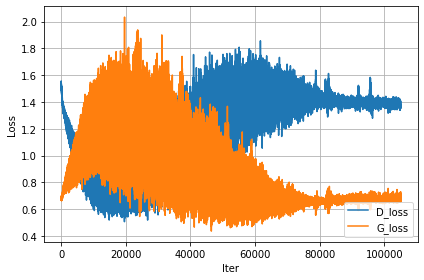

In [82]:
cgan.train()#check for all quartiles

---------- Networks architecture -------------
generator(
  (fc): Sequential(
    (0): Linear(in_features=102, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=256, out_features=20, bias=True)
    (4): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
)
Total number of parameters: 32060
-----------------------------------------------
discriminator(
  (fc): Sequential(
    (0): Linear(in_features=71, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=64, out_features=1, bias=True)
    (4): Sigmoid()
  )
)
Total number of parameters: 4801
models/08.11.03_epoch-3000/CGAN_history_epoch-3000.pkl


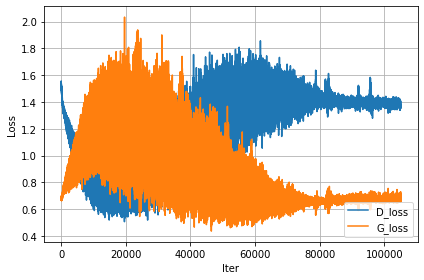

In [83]:
cgan=loadAndPlotModel(epochs,'08.11.03_epoch-3000')

In [84]:
cgan.generateDataBatch(data).head()

condition_vecs size 512 torch.Size([512, 3])
condition_vecs size1.. 512 torch.Size([512, 3])
values in condition_vec1 tensor([[0, 0, 1],
        [1, 0, 0],
        [1, 1, 0],
        ...,
        [1, 6, 0],
        [0, 6, 1],
        [1, 4, 0]])
MERGE STRATS FROM HERE!!!!
shape oof merge (330723, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz'

,finalResult,codeModule,moduleSession,Q1-ExternalQuiz,Q1-DataPlus,Q1-DualPlus,Q1-Folder,Q1-Forumng,Q1-Glossary,Q1-HomePage,...,Q3-OuElluminate,Q3-OuWiki,Q3-PageClicks,Q3-Questionnaire,Q3-Quiz,Q3-RepeatActivity,Q3-Resource,Q3-SharedSubPage,Q3-SubPage,Q3-Url
0,Pass,BBB,J,3.0,3.0,1.0,7.0,1.0,5.0,4.0,...,0.0,96.0,51.0,26.0,29.0,197.0,97.0,91.0,45.0,38.0
1,Fail,GGG,J,3.0,0.0,4.0,1.0,2.0,6.0,4.0,...,107.0,29.0,84.0,57.0,36.0,39.0,91.0,42.0,42.0,136.0
2,Fail,BBB,J,2.0,5.0,5.0,8.0,5.0,5.0,0.0,...,30.0,80.0,57.0,20.0,33.0,183.0,95.0,75.0,48.0,35.0
3,Fail,EEE,J,0.0,8.0,0.0,5.0,5.0,4.0,2.0,...,117.0,38.0,59.0,60.0,30.0,39.0,90.0,71.0,38.0,87.0
4,Fail,BBB,J,3.0,7.0,3.0,0.0,4.0,1.0,1.0,...,67.0,74.0,46.0,45.0,32.0,94.0,112.0,106.0,32.0,40.0


In [681]:
cgan.generateDataBatch(data).max(axis=0)

condition_vecs size 512 torch.Size([512, 3])
condition_vecs size1.. 512 torch.Size([512, 3])
values in condition_vec1 tensor([[1, 5, 1],
        [0, 3, 0],
        [1, 2, 1],
        ...,
        [1, 5, 0],
        [0, 1, 1],
        [0, 4, 0]])
MERGE STRATS FROM HERE!!!!
merge.columnss (335050, 23) Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url'],
      dtype='object')
shape oof merge (335050, 23)
shape of batch from 8870 rows and type pof merge (512, 23) <class 'pandas.core.frame.DataFrame'>
merge_new columns... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder'

finalResult          Pass
codeModule            GGG
moduleSession           J
Q1-ExternalQuiz         8
Q1-DataPlus            17
Q1-DualPlus            13
Q1-Folder              17
Q1-Forumng             12
Q1-Glossary            12
Q1-HomePage             6
Q1-HtmlActivity        12
Q1-OuCollaborate       30
Q1-OuContent            9
Q1-OuElluminate         7
Q1-OuWiki              12
Q1-PageClicks           9
Q1-Questionnaire        8
Q1-Quiz                47
Q1-RepeatActivity      48
Q1-Resource            45
Q1-SharedSubPage       13
Q1-SubPage              8
Q1-Url                 34
Q2-ExternalQuiz         3
Q2-DataPlus             2
Q2-DualPlus             2
Q2-Folder               2
Q2-Forumng              2
Q2-Glossary             2
Q2-HomePage             2
Q2-HtmlActivity         2
Q2-OuCollaborate        2
Q2-OuContent            2
Q2-OuElluminate         2
Q2-OuWiki               2
Q2-PageClicks           2
Q2-Questionnaire        2
Q2-Quiz                 2
Q2-RepeatAct

In [85]:
#batches=batch_size
synthData=cgan.generateData(batches=280)


usePassed=False..
in dataframe... Index(['finalResult', 'codeModule', 'moduleSession', 'Q1-ExternalQuiz',
       'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder', 'Q1-Forumng', 'Q1-Glossary',
       'Q1-HomePage', 'Q1-HtmlActivity', 'Q1-OuCollaborate', 'Q1-OuContent',
       'Q1-OuElluminate', 'Q1-OuWiki', 'Q1-PageClicks', 'Q1-Questionnaire',
       'Q1-Quiz', 'Q1-RepeatActivity', 'Q1-Resource', 'Q1-SharedSubPage',
       'Q1-SubPage', 'Q1-Url', 'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus',
       'Q2-Folder', 'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage',
       'Q2-HtmlActivity', 'Q2-OuCollaborate', 'Q2-OuContent',
       'Q2-OuElluminate', 'Q2-OuWiki', 'Q2-PageClicks', 'Q2-Questionnaire',
       'Q2-Quiz', 'Q2-RepeatActivity', 'Q2-Resource', 'Q2-SharedSubPage',
       'Q2-SubPage', 'Q2-Url', 'Q3-ExternalQuiz', 'Q3-DataPlus', 'Q3-DualPlus',
       'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary', 'Q3-HomePage',
       'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

moduleSession [0 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 0 1
 0 0 1 1 1 1 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 0
 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 1 1
 1 1 1 0 0 1 1 1 1 0 1 1 1 1 0 0 1 1 0 0 0 1 1 1 1 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 1 1 0 0
 0 0 0 1 1 0 1 1 0 1 0 0 0 1 0 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 1
 0 1 0 1 1 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 1 1 0 1 1
 0 1 0 0 1 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1 1 1 0 0 0 0 0 0 0
 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 1 1 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1
 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 1 1 0 0
 1 1 0 0 0 1 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 1 0 0 1 1 0 0 1 0 0 0 0 1
 1 0 0 0 0 

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[44.5866, 39.6234, 38.5130,  ..., 33.1010, 15.6673, 45.6594],
        [56.1746, 36.7411, 26.3498,  ..., 27.3725, 19.3520, 54.6173],
        [51.7357, 28.3462, 17.1144,  ..., 37.1535, 17.7909, 51.6546],
        ...,
        [17.2513, 10.7694, 29.4260,  ..., 63.8808, 14.7679, 37.2188],
        [53.0664, 32.6061, 36.7155,  ..., 53.8049, 12.8349, 18.8348],
        [51.7236, 41.3576, 47.0781,  ..., 26.3660, 17.5115, 60.7173]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 88.  78.  76. ...  65.  30.  90.]
 [111.  72.  52. ...  54.  38. 108.]
 [102.  56.  33. ...  73.  35. 102.]
 ...
 [ 34.  21.  58. ... 127.  29.  73.]
 [105.  64.  72. ... 107.  25.  37.]
 [102.  82.  93. ...  52. 

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (82335, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

finalResult [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1
 1 0 1 0 1 1 1 1 0 1 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 1 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1
 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1
 0 0 0 1 1 0 0 0 0 1 0 1 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0
 1 1 0 1 0 0 1 0 1 0 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0
 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 1
 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 1 0 0 1 1 1 1 0 1 1 0 0 1 1 1 1 0 0 1 1
 0 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0
 0 1 0 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 0 0 1 0 0
 0 0 1 0 1 0 

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (55252, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does 

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (82335, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (82335, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (55252, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (82335, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

randomModules in start-if: tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0]

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

randomCodes in start-if: tensor([[4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],
        [4],


working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[16.3999,  4.1698,  7.2461,  ..., 58.0384, 17.2796, 45.2081],
        [50.5165, 45.5198, 64.3927,  ..., 42.7787, 22.5668, 41.5419],
        [ 7.7887,  5.1205, 33.4488,  ..., 67.2447, 19.3834, 34.7313],
        ...,
        [48.7105, 41.2410, 32.1061,  ..., 38.9634, 22.2525, 50.8136],
        [50.2915, 45.0608, 57.7232,  ..., 44.0448, 21.1126, 25.6203],
        [68.5321, 50.2246, 25.6516,  ..., 18.9507, 18.6748, 60.5389]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 32.   7.  13. ... 115.  34.  89.]
 [100.  90. 128. ...  85.  44.  82.]
 [ 15.   9.  66. ... 133.  38.  68.]
 ...
 [ 96.  81.  63. ...  77.  44. 101.]
 [100.  89. 114. ...  87.  41.  50.]
 [136.  99.  50. ...  37. 

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[57.3592, 34.9426, 34.9472,  ..., 33.0882, 19.6512, 53.8369],
        [48.0503, 35.6459, 33.3844,  ..., 34.3925, 21.5602, 48.5533],
        [34.9095, 37.8859, 62.5744,  ..., 39.3448, 16.5144, 41.4275],
        ...,
        [45.2661, 36.0588, 48.5796,  ..., 43.1805, 17.9673, 40.9306],
        [59.3497, 36.8277, 19.4933,  ..., 30.3807, 21.7648, 52.2763],
        [52.7733, 49.3012, 58.8211,  ..., 29.7190, 16.2885, 56.7302]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[114.  69.  69. ...  65.  38. 107.]
 [ 95.  70.  66. ...  68.  42.  96.]
 [ 69.  75. 124. ...  78.  32.  82.]
 ...
 [ 90.  71.  96. ...  85.  35.  81.]
 [118.  73.  38. ...  60.  43. 104.]
 [105.  98. 117. ...  58. 

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (55252, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (82335, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (18461, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (164095, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

randomModules in start-if: tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]

working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside sample z:...
do we get in this loop!. self.gpuMode torch.Size([512, 20])
does it execute here.....
(samples + 1) / 2 tensor([[34.4848, 38.1057, 47.6138,  ..., 39.0144, 24.7954, 31.6994],
        [51.4249, 56.7823, 50.3456,  ..., 27.2583, 18.6031, 51.1558],
        [35.7027, 32.9573, 32.3835,  ..., 40.1990, 26.8605, 39.9143],
        ...,
        [37.3561, 27.6169, 45.9049,  ..., 47.1690, 15.8803, 44.3777],
        [33.5089, 23.7648, 31.7792,  ..., 46.9176, 18.9763, 38.1066],
        [51.1123, 38.0188, 13.2002,  ..., 26.3101, 21.3005, 62.0482]],
       device='cuda:0', grad_fn=<DivBackward0>)
does it reach here2222........
type of samples and shape:  <class 'numpy.ndarray'> (512, 20)
samples=samples.round() [[ 68.  75.  94. ...  77.  49.  62.]
 [102. 113. 100. ...  54.  36. 101.]
 [ 70.  65.  64. ...  79.  53.  79.]
 ...
 [ 74.  54.  91. ...  93.  31.  88.]
 [ 66.  47.  63. ...  93.  37.  75.]
 [101.  75.  25. ...  52. 

samples=samples.round() [[ 39.  46.  67. ... 122.  33.  35.]
 [ 55.  55.  39. ...  89.  60.  61.]
 [116. 123.  83. ...  51.  34. 109.]
 ...
 [ 94.  35.  22. ... 120.  24.  33.]
 [ 81.  55.  70. ...  86.  39.  85.]
 [ 83.  57.  28. ...  76.  29. 102.]]
finalResult [1 0 0 1 1 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0
 1 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 1 0 0 0 0
 1 1 1 1 0 0 0 0 1 1 0 0 0 1 1 0 1 1 0 1 0 1 1 1 1 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0
 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 1 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 0 1 1 0 1
 1 1 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 0
 1 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 1 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0
 0 0 0 1 1 0 1 0 1 0 0 1 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

MERGE STRATS FROM HERE!!!!
shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (82335, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

MERGE STRATS FROM HERE!!!!
shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', '

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (237168, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (18461, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (933150, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (635748, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (441057, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (287757, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (674584, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (419084, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (541213, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

in batches.. 280
or in else of batches..?
making df to concat with generateDaaaaataBatch..
randomResults  by torch randint in strt-if tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        

shape oof merge (932639, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (608665, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (432881, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (213662, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (55252, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       'Q2-Resource', 'Q2-SharedSubPage', 'Q2-SubPage', 'Q2-Url'],
      dtype='object') (512, 51)
GATE 3
working her!
sample_y_4445566 <class 'torch.Tensor'>
getting inside samp

shape oof merge (381270, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (365429, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (189645, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (169205, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (344989, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

values in condition_vec1 tensor([[1, 3, 1],
        [1, 3, 1],
        [1, 3, 1],
        ...,
        [1, 3, 1],
        [1, 3, 1],
        [1, 3, 1]])
MERGE STRATS FROM HERE!!!!
shape oof merge (280092, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage

shape oof merge (180447, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (82335, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       '

shape oof merge (390468, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (346522, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (212640, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

shape oof merge (118616, 43)
shape of batch from 8870 rows and type pof merge (512, 43) <class 'pandas.core.frame.DataFrame'>
oneHot type to tensor <class 'torch.Tensor'>
COLUMNS OF SMAPLE_Y_: (512, 11)
columns of merge_new..PLZ CHECK (512, 43)
COLUMNS OF SMAPLE_Y_after adding new: Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
       'Q1-ExternalQuiz', 'Q1-DataPlus', 'Q1-DualPlus', 'Q1-Folder',
       'Q1-Forumng', 'Q1-Glossary', 'Q1-HomePage', 'Q1-HtmlActivity',
       'Q1-OuCollaborate', 'Q1-OuContent', 'Q1-OuElluminate', 'Q1-OuWiki',
       'Q1-PageClicks', 'Q1-Questionnaire', 'Q1-Quiz', 'Q1-RepeatActivity',
       'Q1-Resource', 'Q1-SharedSubPage', 'Q1-SubPage', 'Q1-Url',
       'Q2-ExternalQuiz', 'Q2-DataPlus', 'Q2-DualPlus', 'Q2-Folder',
       'Q2-Forumng', 'Q2-Glossary', 'Q2-HomePage', 'Q2-HtmlActivity',
       'Q2-OuCollaborate', 'Q2-OuContent', 'Q2-OuElluminate', 'Q2-OuWiki',
       'Q2-PageClicks', 'Q2-Questionnaire', 'Q2-Quiz', 'Q2-RepeatActivity',
       

In [86]:
synthData=synthData.loc[:,columnsToSelect]
synthData.columns=targetColumns
synthData.to_csv("./Q3_synthetic_cond_Q1+Q2.csv", columns=synthData.columns,index=False)

In [54]:
synthData['finalResult'].value_counts()

Pass    77488
Fail    65872
Name: finalResult, dtype: int64

In [55]:
synthData['moduleSession'].value_counts()

J    79153
B    64207
Name: moduleSession, dtype: int64

In [57]:
synthData['codeModule'].value_counts()

BBB    24677
FFF    24579
DDD    23272
CCC    21139
GGG    20563
EEE    20111
AAA     9019
Name: codeModule, dtype: int64

In [ ]:
'Q3-ExternalQuiz',
       'Q3-DataPlus', 'Q3-DualPlus', 'Q3-Folder', 'Q3-Forumng', 'Q3-Glossary',
       'Q3-HomePage', 'Q3-HtmlActivity', 'Q3-OuCollaborate', 'Q3-OuContent',
       'Q3-OuElluminate', 'Q3-OuWiki', 'Q3-PageClicks', 'Q3-Questionnaire',
       'Q3-Quiz', 'Q3-RepeatActivity', 'Q3-Resource', 'Q3-SharedSubPage',
       'Q3-SubPage','Q3-Url'
